In [1]:
# ------------------------------------------#
#        Expt 5: Perform a battery of negative inference tests from a single script and plot results, save metadata    
# ------------------------------------------#

Threads.nthreads()
begin
    using LinearAlgebra 
    using Plots
    using FFTW
    using FileIO
    using JLD2
    using DiffEqFlux
    using OrdinaryDiffEq
    using BlockArrays
    using LaTeXStrings
    using SparseArrays
    using BSON
    using Distances
    using DifferentialEquations
    using Optimization
    using OptimizationPolyalgorithms
    using Zygote
    using OptimizationOptimJL
    using OptimizationOptimisers
    using DiffEqSensitivity
    using DelimitedFiles
    using HDF5
    using Plots
    using InvertedIndices
    using Random
end 

In [2]:
filename = "/home/tschala/research/LANL/case1_1_1D_waveforms_results.h5"
file = h5open(filename, "r")
# Read the dataset
data1d = read(file["data"])

# Close the file
close(file)

In [3]:
println("Size of 1D data matrix:",size(data1d))
println("Shape: [timesteps,spatial locations,waveforms,variables]")

# note that some elements in space a duplicate
# the real spatial size is 100

Size of 1D data matrix:(300, 110, 47, 4)
Shape: [timesteps,spatial locations,waveforms,variables]


In [4]:
# remove duplicate data (both ends of a segment are saved)
data1d_fix = data1d[200:end,Not(11:11:end),:,:];
# remove the unphysical peaks, just replace with linear interpolation
# data1d_fix[:,41,:,1] = (data1d_fix[:,40,:,1] + data1d_fix[:,42,:,1])/2;
# data1d_fix[:,61,:,1] = (data1d_fix[:,60,:,1] + data1d_fix[:,62,:,1])/2;

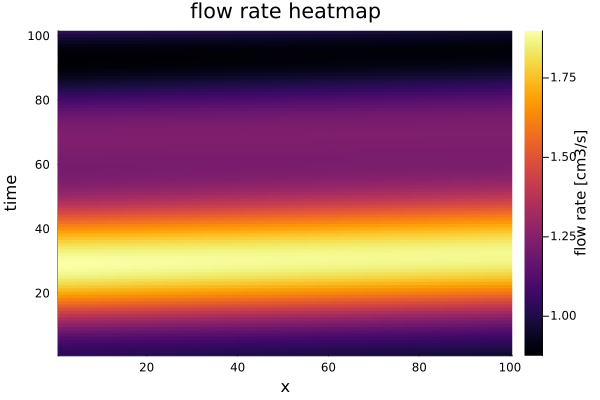

In [5]:
heatmap(data1d_fix[:,:,20,1], title="flow rate heatmap", cbar_title = "flow rate [cm3/s]")
xlabel!("x")
ylabel!("time")


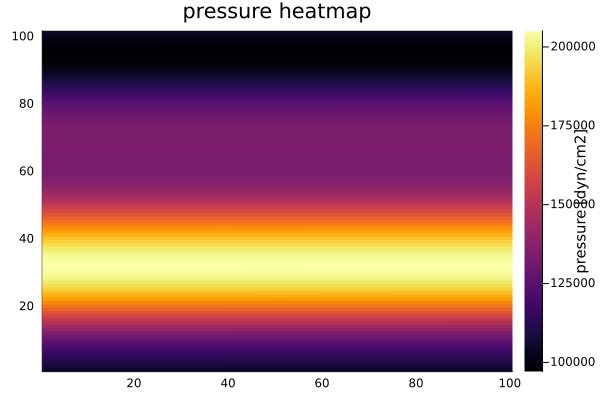

In [6]:
heatmap(data1d_fix[1:end,:,20,2], title="pressure heatmap", cbar_title = "pressure [dyn/cm2]")

In [7]:
begin
    global dz = 0.04                     # time step
    global T = 1.0                   # total time
    global L = 3.96                   # total length
    global zspan = (0,L)                 # end points of time integration for ODEProbem

    global train_maxiters = 5         # number of iterations of learning
    global learning_rate  = 0.005         # learning rate , currently using PolyOpt default (0.1)


end

0.005

In [16]:
using Random

In [20]:
#waveforms to use
waveforms = 30


# Set the seed for reproducibility
Random.seed!(123)

# Shuffle the indices of the vector
shuffled_indices = randperm(size(data1d_fix)[3])

# Divide the shuffled indices into training and test sets
train_indices = shuffled_indices[1:waveforms];
test_indices = shuffled_indices[waveforms+1:end];

In [9]:
# select number of points in x to use

In [31]:
u0 = data1d_fix[1,1:end,train_indices,1];
u01 = data1d_fix[1,1:end,1,1];

u0_test = data1d_fix[1,1:end,test_indices,1];

In [32]:
ytrain2 = data1d_fix[:,1:end,train_indices,1];
ytrain21 = data1d_fix[:,1:end,1,1];

ytest2 = data1d_fix[:,1:end,test_indices,1];

In [33]:
bc_flow = data1d_fix[:,1,train_indices,1];
bc_flow1 = bc_flow[:,1];

bc_flow_test = data1d_fix[:,1,test_indices,1];

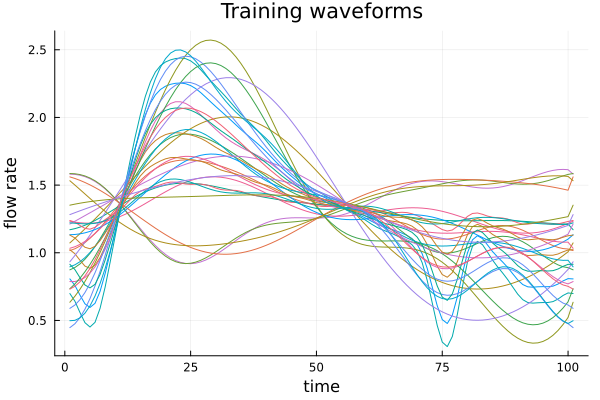

In [34]:
plot(bc_flow, legend = false)
xlabel!("time")
ylabel!("flow rate")
title!("Training waveforms")

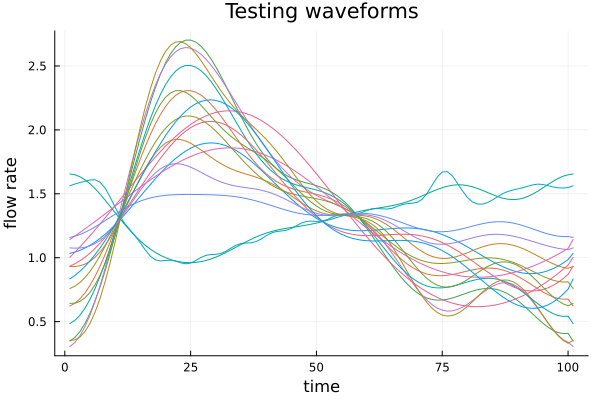

In [35]:
plot(bc_flow_test, legend = false)
xlabel!("time")
ylabel!("flow rate")
title!("Testing waveforms")

In [36]:
N = size(bc_flow1,1)
# NN embedded in PDE for Differential programming
# Define the network architecture with initialization
hidden_dim = 10

ann = Chain(
    Dense(N, hidden_dim, tanh, init = Flux.glorot_uniform),
    Dense(hidden_dim, hidden_dim, tanh, init = Flux.glorot_uniform),
    Dense(hidden_dim, hidden_dim, tanh, init = Flux.glorot_uniform),
    Dense(hidden_dim, N, init = Flux.glorot_uniform)
)

Chain(
  Dense(101 => 10, tanh),               # 1_020 parameters
  Dense(10 => 10, tanh),                # 110 parameters
  Dense(10 => 10, tanh),                # 110 parameters
  Dense(10 => 101),                     # 1_111 parameters
)                   # Total: 8 arrays, 2_351 parameters, 9.684 KiB.

In [37]:
# flatten parameters in NN for learning.                
p, re = Flux.destructure(ann);
ps = deepcopy(p)
p_size = size(p,1);
println("Number of parameters in neural network: $p_size"); 

Number of parameters in neural network: 2351


In [38]:
# function learn_1DBlood(u, p, t, bc_left)
#     Φ = re(p) # restructure flattened parameter vector into NN architecture.
#     # Apply boundary conditions
#     u[1] = bc_left(t)
#     return Φ(u)
# end



function learn_1DBlood(u, p, t)
    Φ = re(p)  # restructure flattened parameter vector into NN architecture.
    
    #concatenate u and the BC as input to the NN
    input = vcat(u)
    
    return Φ(input)  # Call Φ with modified input
end



learn_1DBlood (generic function with 1 method)

In [41]:
ode_solver = "Tsit5"
output_dir = "/home/tschala/research/LANL/paramBC_testNODE"
working_dir = output_dir
# calculate and save the untrained solution 
# begin 
#     learn_1DBlood_prob_untrained(u01,tspan) = ODEProblem((u, p, t) -> learn_1DBlood(u, p, t), bc_flow1, zspan, p)     # p changes after training   
#     if ode_solver == "Tsit5"
#         sol_learn_1DBlood_untrained = Array(solve(learn_1DBlood_prob_untrained(u01,tspan),Tsit5(),alg_hints=[:stiff], dt=dz, saveat=dz, reltol=1e-20)); # save on intervals for which we will train on, dt2 
#     elseif ode_solver == "RK4"
#         sol_learn_1DBlood_untrained = Array(solve(learn_1DBlood_prob_untrained(u01,tspan),RK4(),alg_hints=[:stiff], dt=dz, saveat=dz, reltol=1e-20)); # save on intervals for which we will train on, dt2 
#     elseif ode_solver == "Rosenbrock23"
#         sol_learn_1DBlood_untrained = Array(solve(learn_1DBlood_prob_untrained(u01,tspan),Rosenbrock23(),alg_hints=[:stiff], dt=dz, saveat=dz, reltol=1e-20)); # save on intervals for which we will train on, dt2 
#     end
#     save_object(output_dir*"/sol_learn_testNODE_untrained.jld2",sol_learn_1DBlood_untrained)
#     println("saved untrained solution")
# end 

"/home/tschala/research/LANL/paramBC_testNODE"

In [42]:
prob = ODEProblem((u, p, t) -> learn_1DBlood(u, p, t), bc_flow1, zspan, p) ;
function predict(θ,prob)
    if ode_solver == "Tsit5"
        Array(solve(prob,Tsit5(),p=θ,dt=dz,saveat=dz))
    elseif ode_solver == "RK4"
        Array(solve(prob,RK4(),p=θ,dt=dz,saveat=dz))
    elseif ode_solver == "Rosenbrock23"
        Array(solve(prob,Rosenbrock23(),p=θ,dt=dz,saveat=dz))
    end
end 

predict (generic function with 1 method)

In [43]:
function loss(θ, ytrain21, prob)
    pred = predict(θ, prob)
    l = sum(abs2,(pred - ytrain21))#  + 1e-3*sum(abs.(θ)) #add regularization
    return l, pred
end


# l , pred = loss(ps,ytrain21,prob)

# training optimizer definition
adtype = Optimization.AutoZygote() ;
optf = Optimization.OptimizationFunction((x,p)->loss(x,ytrain21,prob),adtype) ;

In [44]:
path_checkpoint=nothing
optimizer_choice1 = "ADAM"
optimizer_choice2 = "BFGS"

"BFGS"

In [45]:
path_to_working_directory="/home/tschala/research/LANL/juliaDiffProgExample/"

include("$path_to_working_directory/src/numerical_derivatives.jl");
include("$path_to_working_directory/src/train_utils.jl");

In [46]:
# process user choices

if !isdir(working_dir)
    mkdir(working_dir)
end
output_dir = working_dir*"/output/"
cd(working_dir) #switch to working directory
if !isdir(output_dir)
    mkdir(output_dir)
end
println("optimizer 1 is $optimizer_choice1")
if !isnothing(optimizer_choice2)
    println("optimizer 2 is $optimizer_choice2 optimizer")
end

println("ODE Time integrator selected:", ode_solver)


optimizer 1 is ADAM
optimizer 2 is BFGS optimizer
ODE Time integrator selected:Tsit5


In [83]:
# restart training from previaous checkpoint if it exists, else start 
# fresh training.
if !isnothing(path_checkpoint)
    checkpoint_exists = isfile(path_checkpoint)
    if checkpoint_exists
        println("Checkpoint exists!")
        ckpt_restart = jldopen(path_checkpoint,"r")
        res1 = ckpt_restart["ckpt"]
        uinit = copy(res1.u)
    else
        println("ckpt path given, but no file found!")
    end
else
    uinit = deepcopy(ps)
    println("Fresh training initialized")
end

Fresh training initialized


In [84]:

L = 3.96  # total length
zspan = (0.0, L)
println(zspan)
tsteps = 0:dz:zspan[2]  # create time vector

n_epochs = 500
#set batch size
batch_size = 5
println("Batch size:", batch_size)
#training batches
batch_iterations = Int(size(ytrain2,3)/batch_size)
#testing batches
test_batch_iterations = Int(ceil(size(ytest2,3)/batch_size));

(0.0, 3.96)
Batch size:5


Start training epoch 1
waveform batch: 1/6
Using ADAM optimizer
Sum of params:-8.693511
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 86.93026755868178
Iteration: 2 || Loss: 89.5640706695611
Iteration: 3 || Loss: 85.48730211714174
Iteration: 4 || Loss: 82.75226978179143
Iteration: 5 || Loss: 83.45410364408004
Iteration: 6 || Loss: 82.75226978179143
saving ADAM checkpoint...
Sum of params:-8.714329
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 82.75226978179143
Iteration: 2 || Loss: 81.63264858920382
Iteration: 3 || Loss: 67.26355261329128
Iteration: 4 || Loss: 42.23432059427473
Iteration: 5 || Loss: 29.386514364699316
Iteration: 6 || Loss: 22.009373620542966
Iteration: 7 || Loss: 20.624244323473555
Iteration: 8 || Loss: 20.03357705225864
Iteration: 9 || Loss: 19.744388911964812
Iteration: 10 || Loss: 19.44456540340426
Iteration: 11 || Loss: 19.405534346983615
Iteration: 12 || Loss: 19.39977146760004
Iteration: 13 || Loss: 19.394154

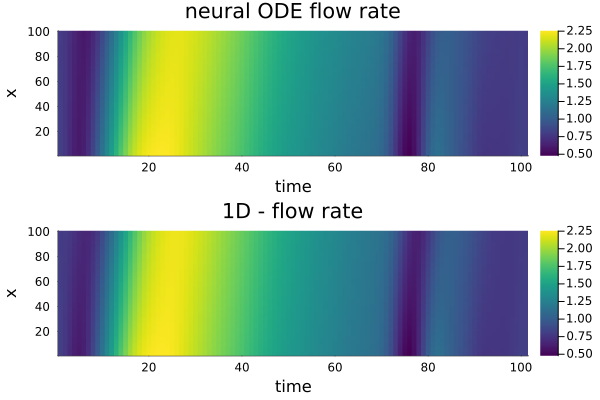

waveform batch: 2/6
Using ADAM optimizer
Sum of params:-8.665659
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 48.529232850776324
Iteration: 2 || Loss: 46.67137034052673
Iteration: 3 || Loss: 46.93635269666768
Iteration: 4 || Loss: 44.922125949008255
Iteration: 5 || Loss: 43.91608927461808
Iteration: 6 || Loss: 43.91608927461808
saving ADAM checkpoint...
Sum of params:-8.703901
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 43.91608927461808
Iteration: 2 || Loss: 43.69808708044835
Iteration: 3 || Loss: 41.09970863418016
Iteration: 4 || Loss: 37.84555595932621
Iteration: 5 || Loss: 35.50619685294161
Iteration: 6 || Loss: 34.912806710363796
Iteration: 7 || Loss: 34.67484197806841
Iteration: 8 || Loss: 34.60813162663446
Iteration: 9 || Loss: 34.56999963002507
Iteration: 10 || Loss: 34.548683431157045
Iteration: 11 || Loss: 34.54250450558102
Iteration: 12 || Loss: 34.53813528958712
Iteration: 13 || Loss: 34.47644235451313
Iteration: 14 

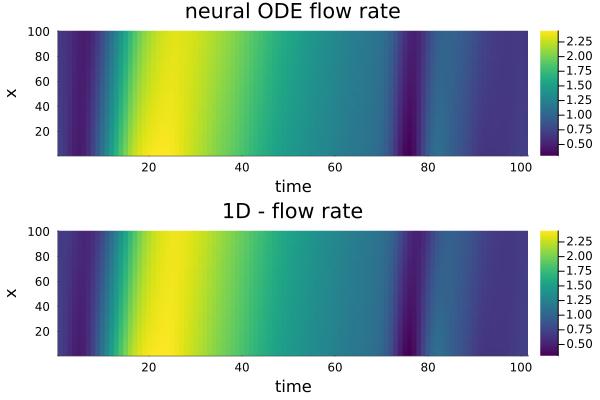

waveform batch: 3/6
Using ADAM optimizer
Sum of params:-9.011646
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 312.16074458174967
Iteration: 2 || Loss: 281.3557639193749
Iteration: 3 || Loss: 274.76483596012565
Iteration: 4 || Loss: 277.11599536559504
Iteration: 5 || Loss: 275.7441845461958
Iteration: 6 || Loss: 274.76483596012565
saving ADAM checkpoint...
Sum of params:-8.972256
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 274.76483596012565
Iteration: 2 || Loss: 253.96810240882937
Iteration: 3 || Loss: 179.80845791281075
Iteration: 4 || Loss: 70.33049033146384
Iteration: 5 || Loss: 46.02069426468548
Iteration: 6 || Loss: 42.78199362666223
Iteration: 7 || Loss: 35.776225052843365
Iteration: 8 || Loss: 34.33212619805033
Iteration: 9 || Loss: 33.04256603627434
Iteration: 10 || Loss: 32.24570800262516
Iteration: 11 || Loss: 31.458183857130045
Iteration: 12 || Loss: 31.112556762958135
Iteration: 13 || Loss: 30.968834727688037
Iterati

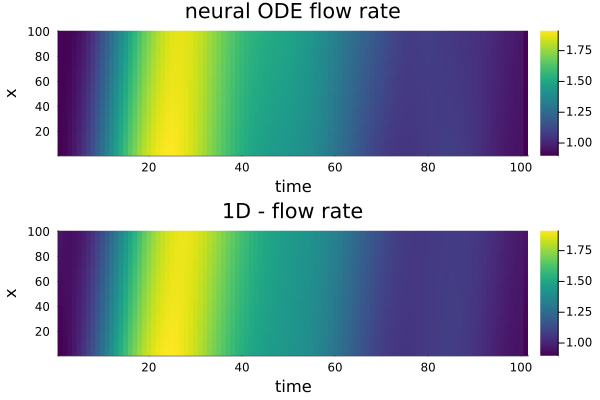

waveform batch: 4/6
Using ADAM optimizer
Sum of params:-7.657727
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 70.69347268948012
Iteration: 2 || Loss: 61.92875948554287
Iteration: 3 || Loss: 57.87998181747143
Iteration: 4 || Loss: 57.2268341643932
Iteration: 5 || Loss: 57.855353037394
Iteration: 6 || Loss: 57.2268341643932
saving ADAM checkpoint...
Sum of params:-7.552586
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 57.2268341643932
Iteration: 2 || Loss: 56.81247371603653
Iteration: 3 || Loss: 47.44204695955156
Iteration: 4 || Loss: 42.7014992280528
Iteration: 5 || Loss: 38.018849919254045
Iteration: 6 || Loss: 35.90041859825541
Iteration: 7 || Loss: 35.67537183952753
Iteration: 8 || Loss: 35.62081784072595
Iteration: 9 || Loss: 35.4890048697966
Iteration: 10 || Loss: 34.834492031017916
Iteration: 11 || Loss: 34.51970462125659
Iteration: 12 || Loss: 33.922296864683524
Iteration: 13 || Loss: 33.648816110902374
Iteration: 14 || Loss

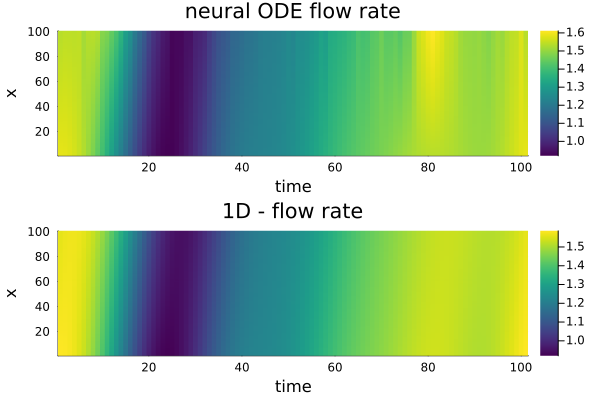

waveform batch: 5/6
Using ADAM optimizer
Sum of params:-9.124863
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 350.09668765128276
Iteration: 2 || Loss: 228.43675695776255
Iteration: 3 || Loss: 142.963297073577
Iteration: 4 || Loss: 90.7917048645902
Iteration: 5 || Loss: 67.17214412245657
Iteration: 6 || Loss: 67.17214412245657
saving ADAM checkpoint...
Sum of params:-8.989513
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 67.17214412245657
Iteration: 2 || Loss: 62.97601754125057
Iteration: 3 || Loss: 31.554825258560243
Iteration: 4 || Loss: 24.17057256097442
Iteration: 5 || Loss: 20.227431861738957
Iteration: 6 || Loss: 11.194880512657491
Iteration: 7 || Loss: 9.562555761941935
Iteration: 8 || Loss: 8.637301590187027
Iteration: 9 || Loss: 8.46778544162263
Iteration: 10 || Loss: 8.431586897487392
Iteration: 11 || Loss: 8.405277581366013
Iteration: 12 || Loss: 8.378856544234015
Iteration: 13 || Loss: 8.350000905826422
Iteration: 14 ||

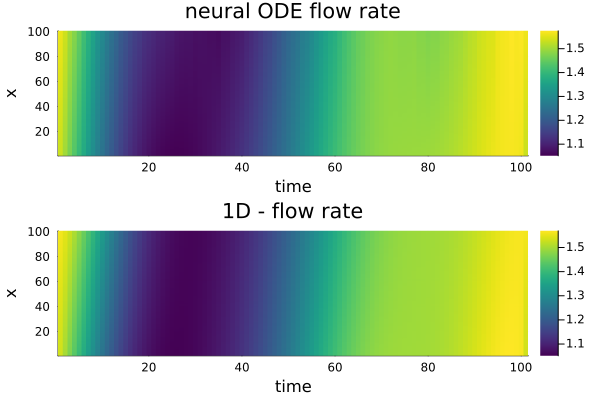

waveform batch: 6/6
Using ADAM optimizer
Sum of params:-8.038376
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 45.55124515517966
Iteration: 2 || Loss: 36.78588455941608
Iteration: 3 || Loss: 33.67467911093011
Iteration: 4 || Loss: 34.44551744185675
Iteration: 5 || Loss: 35.7993853322621
Iteration: 6 || Loss: 33.67467911093011
saving ADAM checkpoint...
Sum of params:-7.9485083
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 33.67467911093011
Iteration: 2 || Loss: 29.410579428921693
Iteration: 3 || Loss: 28.39485149862687
Iteration: 4 || Loss: 19.315213139970275
Iteration: 5 || Loss: 16.380586561012965
Iteration: 6 || Loss: 16.04946054380081
Iteration: 7 || Loss: 16.012433584719357
Iteration: 8 || Loss: 16.00213861976386
Iteration: 9 || Loss: 15.969822980807855
Iteration: 10 || Loss: 15.937224832582345
Iteration: 11 || Loss: 15.815868434837865
Iteration: 12 || Loss: 15.324232093885362
Iteration: 13 || Loss: 14.461067045387052
Iteration

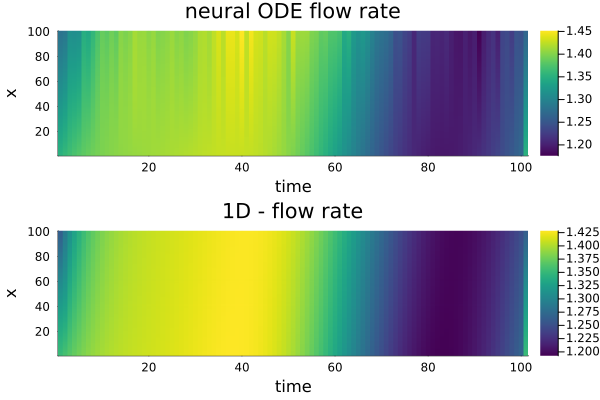

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Testing:
waveform batch: 1/4
Test loss:1029.3215602060905


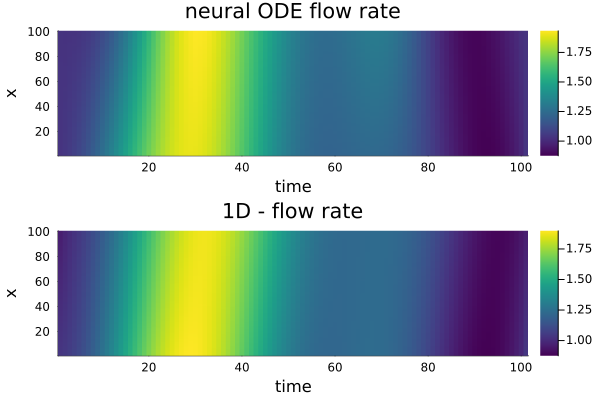

waveform batch: 2/4
Test loss:35.27777291453008


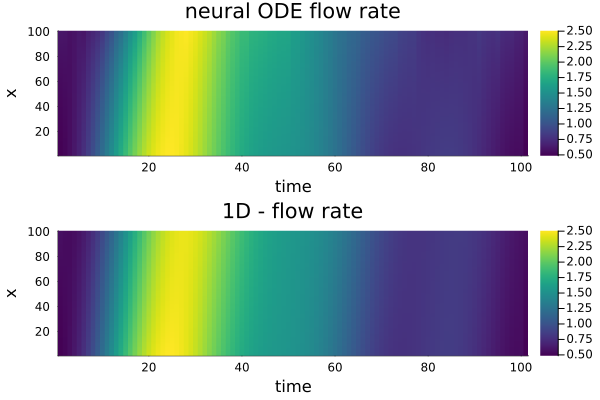

waveform batch: 3/4
Test loss:38.19043171435


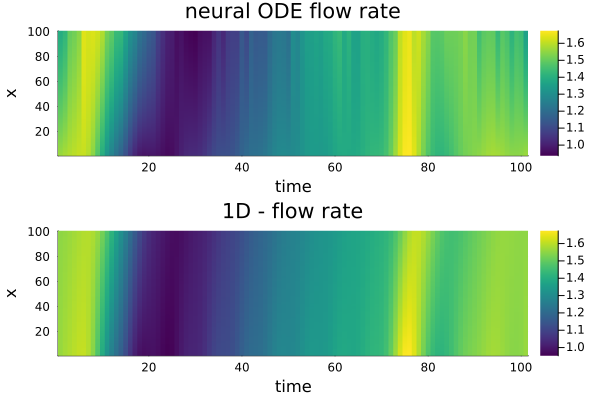

waveform batch: 4/4
Test loss:19.113726871932755


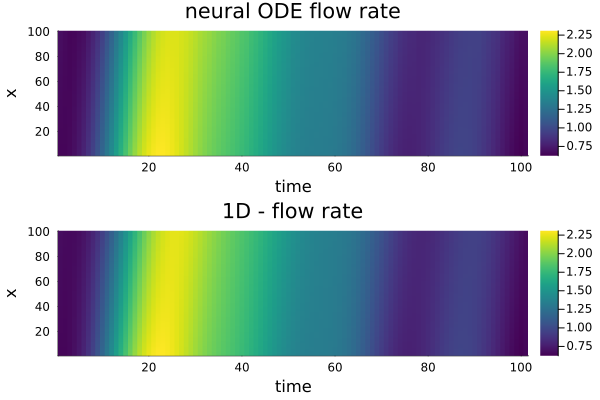

Epoch 1 mean loss loss:3.6653730953109416
Start training epoch 2
waveform batch: 1/6
Using ADAM optimizer
Sum of params:-5.083764
Changing learning rate to:0.0001
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 50.96330371458029
Iteration: 2 || Loss: 46.8486910743009
Iteration: 3 || Loss: 46.985341222428644
Iteration: 4 || Loss: 45.63037274517855
Iteration: 5 || Loss: 43.40872188671067
Iteration: 6 || Loss: 43.40872188671067
saving ADAM checkpoint...
Sum of params:-5.2415295
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 43.40872188671067
Iteration: 2 || Loss: 42.559778235264794
Iteration: 3 || Loss: 36.04276714882375
Iteration: 4 || Loss: 35.14022228996493
Iteration: 5 || Loss: 33.28806994612599
Iteration: 6 || Loss: 32.261644998940604
Iteration: 7 || Loss: 32.04484071650758
Iteration: 8 || Loss: 31.810962409482308
Iteration: 9 || Loss: 31.291868444496032
Iteration: 10 || Loss: 30.931929340921705
Iteration: 11 || Loss: 30.85413242628

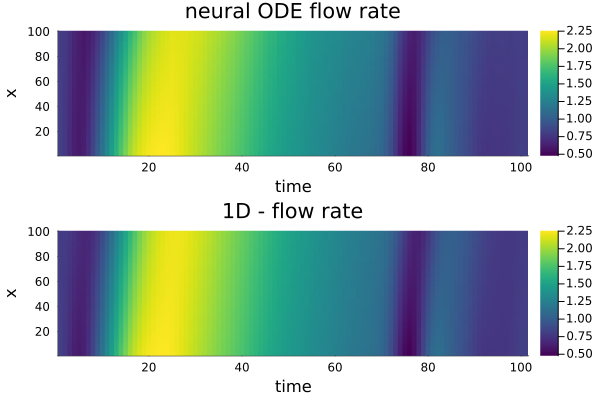

waveform batch: 2/6
Using ADAM optimizer
Sum of params:-5.899239
Changing learning rate to:0.0001
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 397.19698512509626
Iteration: 2 || Loss: 223.476987518107
Iteration: 3 || Loss: 142.8347169287488
Iteration: 4 || Loss: 107.70043232619281
Iteration: 5 || Loss: 95.80005744931805
Iteration: 6 || Loss: 95.80005744931805
saving ADAM checkpoint...
Sum of params:-5.778947
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 95.80005744931805
Iteration: 2 || Loss: 72.21017795823002
Iteration: 3 || Loss: 70.73796559204933
Iteration: 4 || Loss: 48.22742872074261
Iteration: 5 || Loss: 44.851429225864926
Iteration: 6 || Loss: 42.47501287838407
Iteration: 7 || Loss: 40.776817976772506
Iteration: 8 || Loss: 40.13242580603914
Iteration: 9 || Loss: 39.866896877920894
Iteration: 10 || Loss: 39.4295682682415
Iteration: 11 || Loss: 38.95854754278133
Iteration: 12 || Loss: 38.664576067570266
Iteration: 13 || Loss:

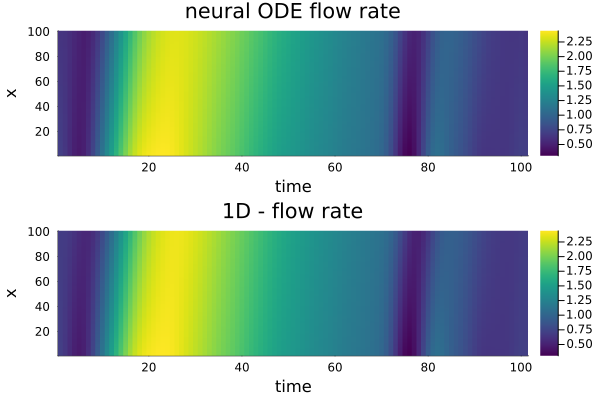

waveform batch: 3/6
Using ADAM optimizer
Sum of params:-5.0441213
Changing learning rate to:0.0001
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 61.539714477104646
Iteration: 2 || Loss: 54.97276904474737
Iteration: 3 || Loss: 53.49205108287566
Iteration: 4 || Loss: 52.894178144496436
Iteration: 5 || Loss: 51.10979198580597
Iteration: 6 || Loss: 51.10979198580597
saving ADAM checkpoint...
Sum of params:-5.0425615
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 51.10979198580597
Iteration: 2 || Loss: 49.38453667185167
Iteration: 3 || Loss: 41.81793641495065
Iteration: 4 || Loss: 37.05446344214326
Iteration: 5 || Loss: 34.0053395503236
Iteration: 6 || Loss: 33.12567769473755
Iteration: 7 || Loss: 32.78647971474414
Iteration: 8 || Loss: 32.477622596775745
Iteration: 9 || Loss: 32.3067833353881
Iteration: 10 || Loss: 32.28091785010345
Iteration: 11 || Loss: 32.277408506893075
Iteration: 12 || Loss: 32.27547388510078
Iteration: 13 || Loss:

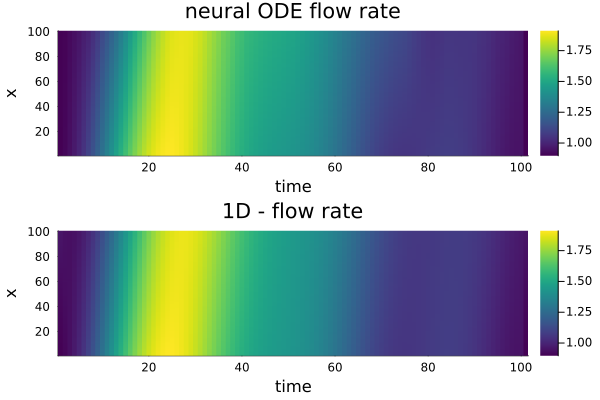

waveform batch: 4/6
Using ADAM optimizer
Sum of params:-6.38354
Changing learning rate to:0.0001
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 1432.8831992469693
Iteration: 2 || Loss: 1338.9047435078492
Iteration: 3 || Loss: 1253.990283258815
Iteration: 4 || Loss: 1177.9912614663472
Iteration: 5 || Loss: 1110.7685774852932
Iteration: 6 || Loss: 1110.7685774852932
saving ADAM checkpoint...
Sum of params:-6.6174088
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 1110.7685774852932
Iteration: 2 || Loss: 962.4996883070128
Iteration: 3 || Loss: 103.20891585397374
Iteration: 4 || Loss: 68.25883361187714
Iteration: 5 || Loss: 53.00135227839881
Iteration: 6 || Loss: 51.18594327637964
Iteration: 7 || Loss: 47.674128872544195
Iteration: 8 || Loss: 46.35859559310903
Iteration: 9 || Loss: 45.294998659889465
Iteration: 10 || Loss: 42.40319425661976
Iteration: 11 || Loss: 41.8445009749682
Iteration: 12 || Loss: 39.21632434378609
Iteration: 13 || L

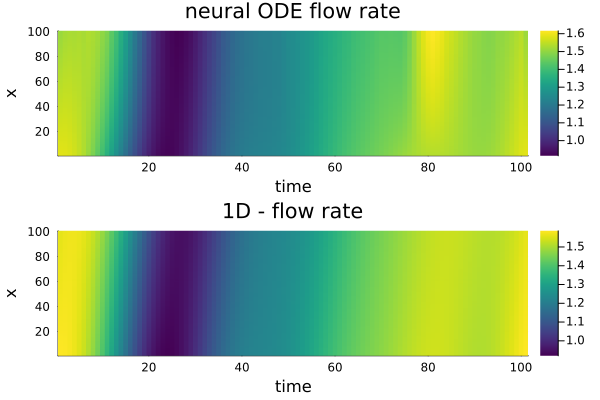

waveform batch: 5/6
Using ADAM optimizer
Sum of params:25.086468
Changing learning rate to:0.0001
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 32.19143647034324
Iteration: 2 || Loss: 31.407232922675565
Iteration: 3 || Loss: 29.37494934161264
Iteration: 4 || Loss: 28.551561141677325
Iteration: 5 || Loss: 27.390629153709313
Iteration: 6 || Loss: 27.390629153709313
saving ADAM checkpoint...
Sum of params:24.953688
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 27.390629153709313
Iteration: 2 || Loss: 27.05571035138626
Iteration: 3 || Loss: 21.065335144316528
Iteration: 4 || Loss: 14.524245431655219
Iteration: 5 || Loss: 9.847251824298178
Iteration: 6 || Loss: 9.34670240647206
Iteration: 7 || Loss: 9.190083798541117
Iteration: 8 || Loss: 9.12557162500933
Iteration: 9 || Loss: 8.932418557684906
Iteration: 10 || Loss: 8.368381177370104
Iteration: 11 || Loss: 7.953369822943118
Iteration: 12 || Loss: 7.809407496706058
Iteration: 13 || Loss

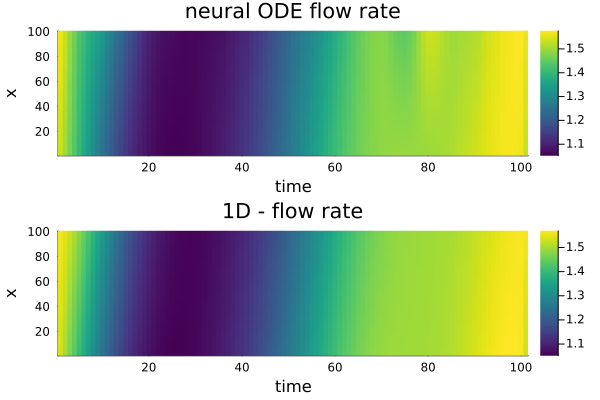

waveform batch: 6/6
Using ADAM optimizer
Sum of params:24.01656
Changing learning rate to:0.0001
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 287.97960769620937
Iteration: 2 || Loss: 220.39935031011342
Iteration: 3 || Loss: 174.27771123419237
Iteration: 4 || Loss: 147.36117468586497
Iteration: 5 || Loss: 135.721834476404
Iteration: 6 || Loss: 135.721834476404
saving ADAM checkpoint...
Sum of params:23.920069
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 135.721834476404
Iteration: 2 || Loss: 125.85584146524342
Iteration: 3 || Loss: 52.13556655949629
Iteration: 4 || Loss: 37.5015654095397
Iteration: 5 || Loss: 31.897019492994893
Iteration: 6 || Loss: 25.614391775622188
Iteration: 7 || Loss: 22.003859395638962
Iteration: 8 || Loss: 21.342240280530394
Iteration: 9 || Loss: 20.70711660266748
Iteration: 10 || Loss: 20.621905650941123
Iteration: 11 || Loss: 20.610356030245725
Iteration: 12 || Loss: 20.599624412145687
Iteration: 13 || Lo

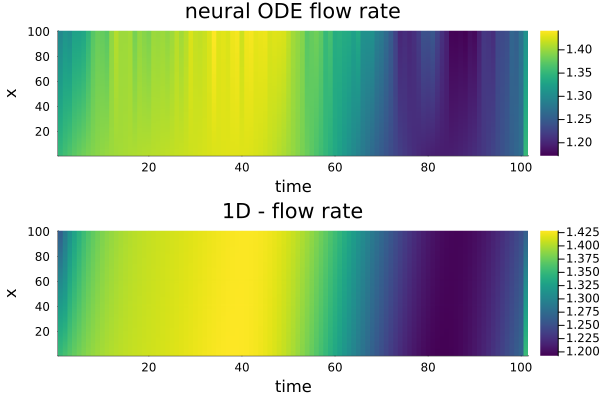

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Testing:
waveform batch: 1/4
Test loss:28.35847722216645


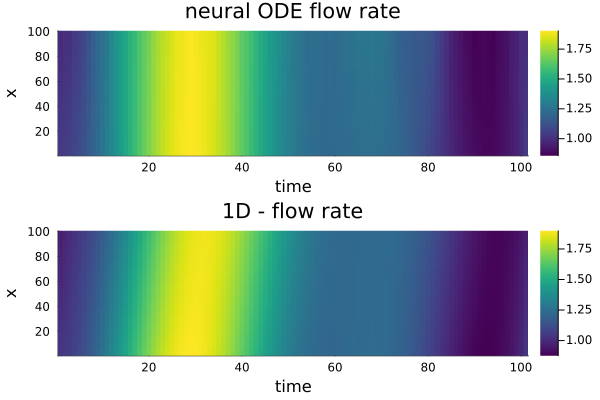

waveform batch: 2/4
Test loss:32.87273107899736


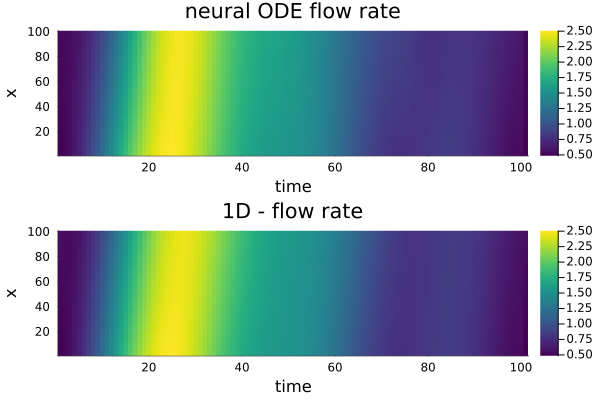

waveform batch: 3/4
Test loss:58.46712394493607


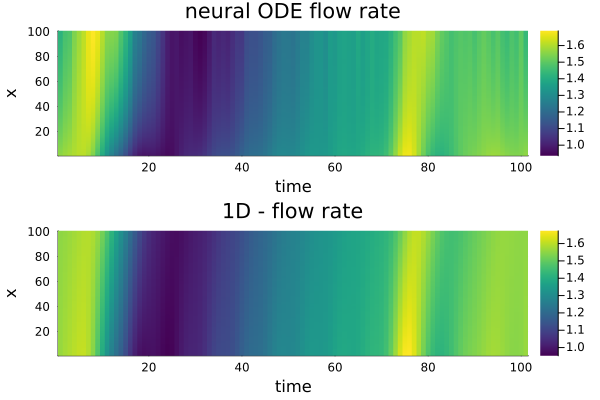

waveform batch: 4/4
Test loss:30.287009162592657


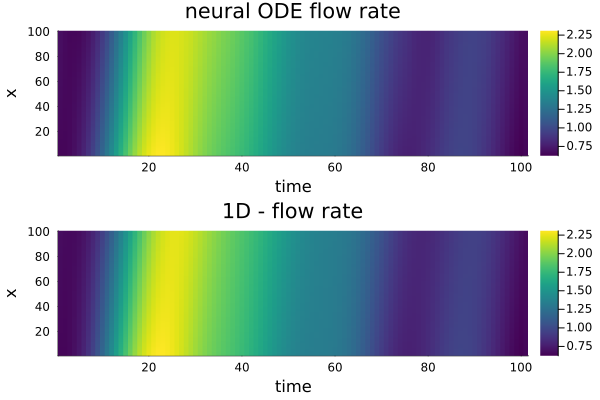

Epoch 2 mean loss loss:3.737050537015498
Start training epoch 3
waveform batch: 1/6
Using ADAM optimizer
Sum of params:25.41211
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 45.476786182729946
Iteration: 2 || Loss: 44.37708432889935
Iteration: 3 || Loss: 42.493288947903004
Iteration: 4 || Loss: 39.950364090071
Iteration: 5 || Loss: 38.41289652403304
Iteration: 6 || Loss: 38.41289652403304
saving ADAM checkpoint...
Sum of params:25.327366
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 38.41289652403304
Iteration: 2 || Loss: 38.28243237784491
Iteration: 3 || Loss: 33.10031588712204
Iteration: 4 || Loss: 27.636207180993058
Iteration: 5 || Loss: 26.041291485735474
Iteration: 6 || Loss: 25.06688148505037
Iteration: 7 || Loss: 24.7691723856272
Iteration: 8 || Loss: 24.63045916032499
Iteration: 9 || Loss: 24.579400910860016
Iteration: 10 || Loss: 24.557763001716154
Iteration: 11 || Loss: 24.54499149632199
Iteration: 12 || Loss: 24.44663436

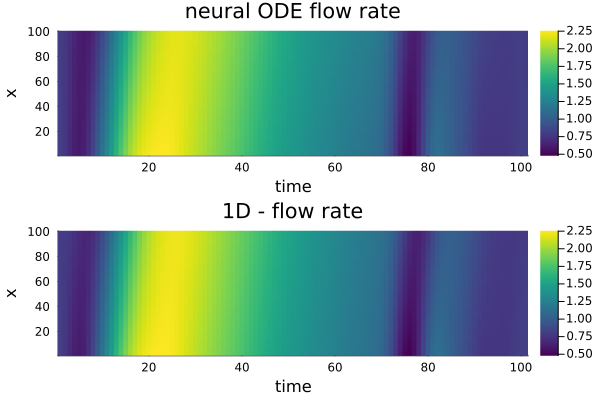

waveform batch: 2/6
Using ADAM optimizer
Sum of params:24.096542
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 57.5111974557695
Iteration: 2 || Loss: 60.5304083644841
Iteration: 3 || Loss: 55.81337980174756
Iteration: 4 || Loss: 56.87070895075459
Iteration: 5 || Loss: 56.73606476729042
Iteration: 6 || Loss: 55.81337980174756
saving ADAM checkpoint...
Sum of params:24.11391
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 55.81337980174756
Iteration: 2 || Loss: 55.756258871530434
Iteration: 3 || Loss: 47.82591804018957
Iteration: 4 || Loss: 41.053201577973965
Iteration: 5 || Loss: 40.28088705445767
Iteration: 6 || Loss: 40.186771360268715
Iteration: 7 || Loss: 40.155987875666774
Iteration: 8 || Loss: 40.12182650178816
Iteration: 9 || Loss: 40.08303411397462
Iteration: 10 || Loss: 40.06477178799268
Iteration: 11 || Loss: 40.05644646219412
Iteration: 12 || Loss: 40.01496600766687
Iteration: 13 || Loss: 39.935558202001495
Iteration: 14 ||

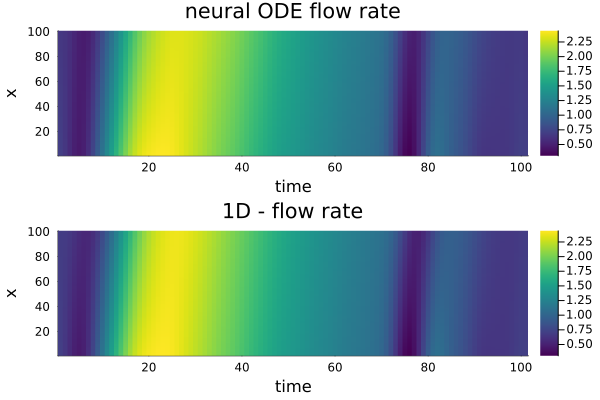

waveform batch: 3/6
Using ADAM optimizer
Sum of params:24.334217
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 79.472659517583
Iteration: 2 || Loss: 78.76283003615912
Iteration: 3 || Loss: 76.7865097705159
Iteration: 4 || Loss: 73.80449021191399
Iteration: 5 || Loss: 73.0976550351136
Iteration: 6 || Loss: 73.0976550351136
saving ADAM checkpoint...
Sum of params:24.26585
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 73.0976550351136
Iteration: 2 || Loss: 72.17665731184964
Iteration: 3 || Loss: 61.81664354397477
Iteration: 4 || Loss: 55.322341096996325
Iteration: 5 || Loss: 47.64156221195205
Iteration: 6 || Loss: 43.555940779528775
Iteration: 7 || Loss: 41.76256482742852
Iteration: 8 || Loss: 40.72288688263073
Iteration: 9 || Loss: 39.51118019084042
Iteration: 10 || Loss: 38.671557645265125
Iteration: 11 || Loss: 37.46846247525032
Iteration: 12 || Loss: 36.59393657214297
Iteration: 13 || Loss: 35.9631418522145
Iteration: 14 || Loss: 

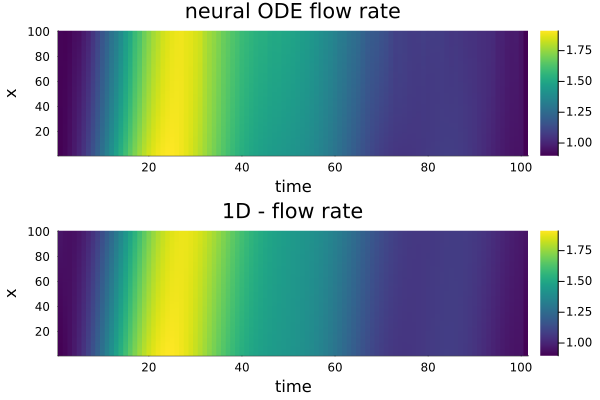

waveform batch: 4/6
Using ADAM optimizer
Sum of params:24.381874
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 60.31017631930772
Iteration: 2 || Loss: 51.78646698864296
Iteration: 3 || Loss: 48.32237246316069
Iteration: 4 || Loss: 48.20379723920618
Iteration: 5 || Loss: 49.04752283520768
Iteration: 6 || Loss: 48.20379723920618
saving ADAM checkpoint...
Sum of params:24.271116
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 48.20379723920618
Iteration: 2 || Loss: 47.779059481835944
Iteration: 3 || Loss: 42.634183461790556
Iteration: 4 || Loss: 36.4701512362876
Iteration: 5 || Loss: 33.966417764785355
Iteration: 6 || Loss: 33.33258640573527
Iteration: 7 || Loss: 33.14258560507696
Iteration: 8 || Loss: 33.070150753892435
Iteration: 9 || Loss: 32.95684565793511
Iteration: 10 || Loss: 32.855501735027296
Iteration: 11 || Loss: 32.65910407118243
Iteration: 12 || Loss: 32.3344316306216
Iteration: 13 || Loss: 32.200156376629536
Iteration: 14 

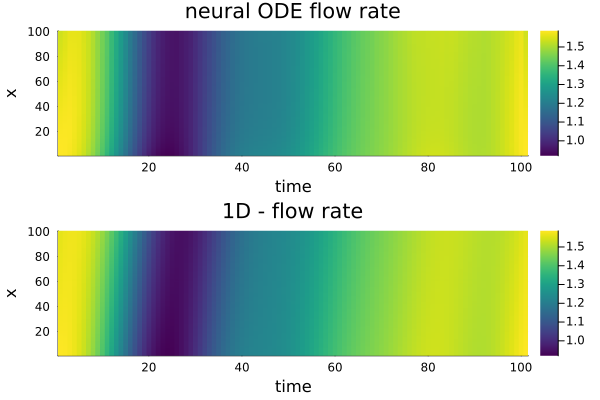

waveform batch: 5/6
Using ADAM optimizer
Sum of params:22.955284
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 81.60250839615256
Iteration: 2 || Loss: 77.76246177879253
Iteration: 3 || Loss: 76.86748604691121
Iteration: 4 || Loss: 75.13712758966052
Iteration: 5 || Loss: 72.63368383748303
Iteration: 6 || Loss: 72.63368383748303
saving ADAM checkpoint...
Sum of params:22.900486
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 72.63368383748303
Iteration: 2 || Loss: 72.19790940775363
Iteration: 3 || Loss: 59.04091085259637
Iteration: 4 || Loss: 44.520497129063735
Iteration: 5 || Loss: 30.937613577960867
Iteration: 6 || Loss: 24.415451028732548
Iteration: 7 || Loss: 22.8551811992771
Iteration: 8 || Loss: 22.01560551553484
Iteration: 9 || Loss: 21.664119574826803
Iteration: 10 || Loss: 21.37930563472858
Iteration: 11 || Loss: 21.267069990854033
Iteration: 12 || Loss: 21.235082663319993
Iteration: 13 || Loss: 21.225403557287663
Iteration: 1

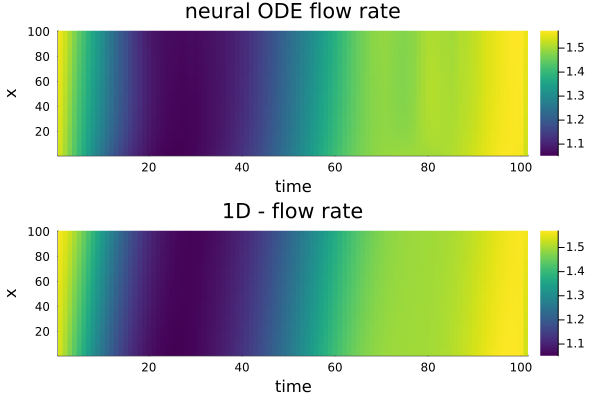

waveform batch: 6/6
Using ADAM optimizer
Sum of params:23.380371
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 84.82048756177133
Iteration: 2 || Loss: 70.82312025507846
Iteration: 3 || Loss: 68.4908421576344
Iteration: 4 || Loss: 69.71251431073223
Iteration: 5 || Loss: 68.94700263338257
Iteration: 6 || Loss: 68.4908421576344
saving ADAM checkpoint...
Sum of params:23.324774
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 68.4908421576344
Iteration: 2 || Loss: 67.74698665518181
Iteration: 3 || Loss: 47.38025825231388
Iteration: 4 || Loss: 34.39122810691421
Iteration: 5 || Loss: 28.773220266214825
Iteration: 6 || Loss: 26.77161353516236
Iteration: 7 || Loss: 24.62408528426225
Iteration: 8 || Loss: 23.3256592048765
Iteration: 9 || Loss: 22.293456043093023
Iteration: 10 || Loss: 22.038854886613304
Iteration: 11 || Loss: 21.8696361299152
Iteration: 12 || Loss: 21.844513414617495
Iteration: 13 || Loss: 21.839141571536796
Iteration: 14 || L

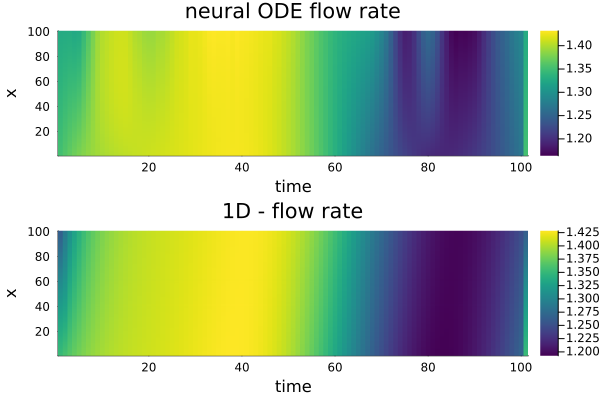

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Testing:
waveform batch: 1/4
Test loss:27.90632288577182


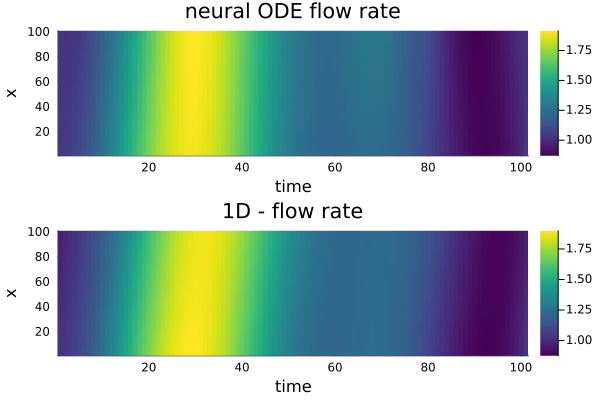

waveform batch: 2/4
Test loss:79.997183122045


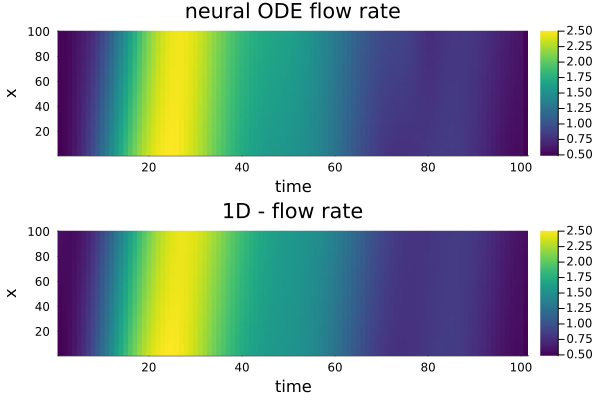

waveform batch: 3/4
Test loss:80.49905393473239


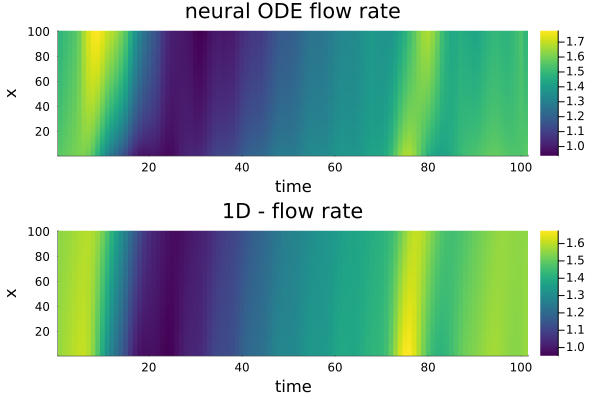

waveform batch: 4/4
Test loss:17.76754836964829


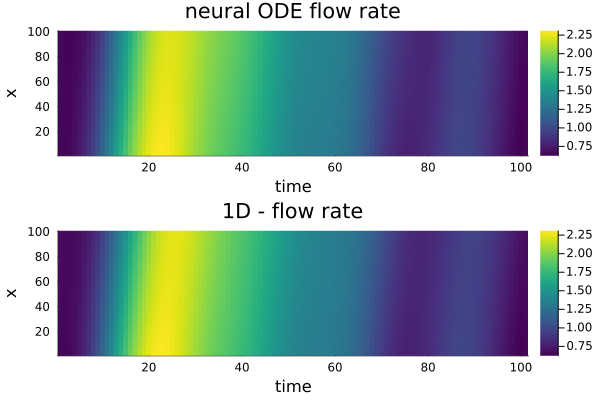

Epoch 3 mean loss loss:3.400705296097603
Start training epoch 4
waveform batch: 1/6
Using ADAM optimizer
Sum of params:24.284107
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 113.97031214027258
Iteration: 2 || Loss: 90.1243892023915
Iteration: 3 || Loss: 85.6111802342702
Iteration: 4 || Loss: 87.87414263723271
Iteration: 5 || Loss: 86.46926448992016
Iteration: 6 || Loss: 85.6111802342702
saving ADAM checkpoint...
Sum of params:24.237024
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 85.6111802342702
Iteration: 2 || Loss: 83.68967924520418
Iteration: 3 || Loss: 45.519256763948086
Iteration: 4 || Loss: 38.688607144868186
Iteration: 5 || Loss: 35.33579935401346
Iteration: 6 || Loss: 33.78709315105549
Iteration: 7 || Loss: 30.097127697580394
Iteration: 8 || Loss: 28.240271206777795
Iteration: 9 || Loss: 25.582562275575615
Iteration: 10 || Loss: 24.618378409968177
Iteration: 11 || Loss: 24.05450713169933
Iteration: 12 || Loss: 23.8289273

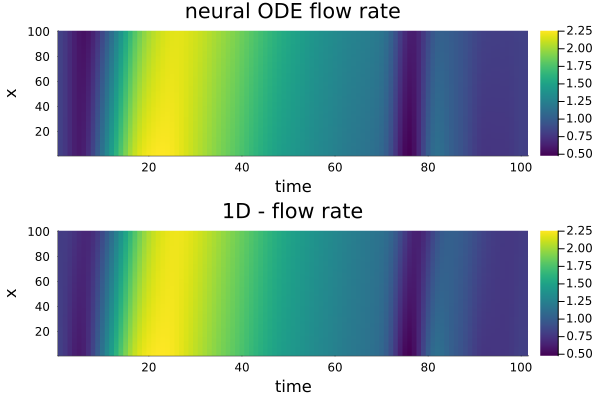

waveform batch: 2/6
Using ADAM optimizer
Sum of params:16.830448
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 74.90237798133667
Iteration: 2 || Loss: 67.12414792749031
Iteration: 3 || Loss: 70.00727755133363
Iteration: 4 || Loss: 64.38892840044916
Iteration: 5 || Loss: 59.85464731389501
Iteration: 6 || Loss: 59.85464731389501
saving ADAM checkpoint...
Sum of params:16.848196
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 59.85464731389501
Iteration: 2 || Loss: 59.742926971781934
Iteration: 3 || Loss: 50.20696156887632
Iteration: 4 || Loss: 47.713372841423336
Iteration: 5 || Loss: 43.83733037714464
Iteration: 6 || Loss: 41.465653023176486
Iteration: 7 || Loss: 40.87965140325316
Iteration: 8 || Loss: 40.1358542738724
Iteration: 9 || Loss: 39.00743262032019
Iteration: 10 || Loss: 37.847030904769
Iteration: 11 || Loss: 37.58859170255469
Iteration: 12 || Loss: 37.55181460558199
Iteration: 13 || Loss: 37.510649027823135
Iteration: 14 || 

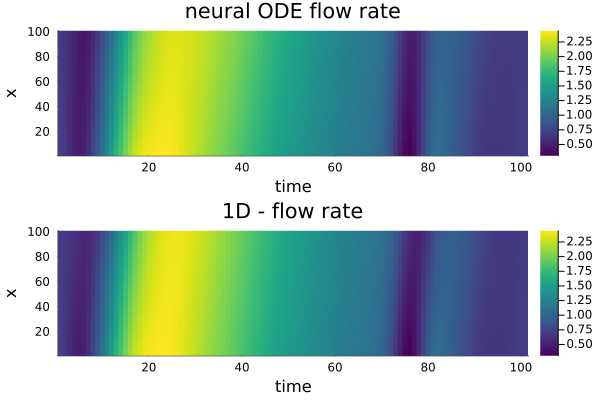

waveform batch: 3/6
Using ADAM optimizer
Sum of params:16.616001
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 59.95534263140896
Iteration: 2 || Loss: 62.16915310077179
Iteration: 3 || Loss: 56.10165306381476
Iteration: 4 || Loss: 58.53371570837497
Iteration: 5 || Loss: 55.620786713038584
Iteration: 6 || Loss: 55.620786713038584
saving ADAM checkpoint...
Sum of params:16.673235
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 55.620786713038584
Iteration: 2 || Loss: 52.83616199677006
Iteration: 3 || Loss: 42.95103006801561
Iteration: 4 || Loss: 37.96792990660345
Iteration: 5 || Loss: 34.73198163901995
Iteration: 6 || Loss: 32.747703189203094
Iteration: 7 || Loss: 31.254159443890302
Iteration: 8 || Loss: 30.779688403730255
Iteration: 9 || Loss: 30.272533428122397
Iteration: 10 || Loss: 28.52995392555643
Iteration: 11 || Loss: 27.992931390906207
Iteration: 12 || Loss: 27.539753410009
Iteration: 13 || Loss: 27.204959570809457
Iteration: 

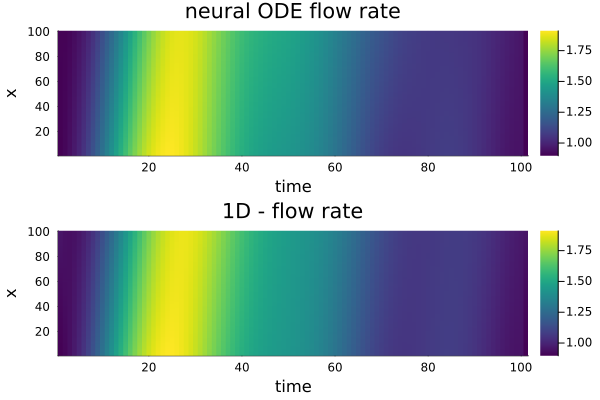

waveform batch: 4/6
Using ADAM optimizer
Sum of params:17.324635
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 218.5024517676087
Iteration: 2 || Loss: 178.58939986369086
Iteration: 3 || Loss: 164.8590557893647
Iteration: 4 || Loss: 164.24352066295336
Iteration: 5 || Loss: 160.49297549868157
Iteration: 6 || Loss: 160.49297549868157
saving ADAM checkpoint...
Sum of params:17.287508
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 160.49297549868157
Iteration: 2 || Loss: 144.19537037705936
Iteration: 3 || Loss: 48.58464300351908
Iteration: 4 || Loss: 44.41570544484222
Iteration: 5 || Loss: 40.19017412414766
Iteration: 6 || Loss: 39.31050634668894
Iteration: 7 || Loss: 36.643236671799045
Iteration: 8 || Loss: 36.09512092169814
Iteration: 9 || Loss: 32.193230697571174
Iteration: 10 || Loss: 29.883797406905913
Iteration: 11 || Loss: 29.199795416997894
Iteration: 12 || Loss: 27.7426663403695
Iteration: 13 || Loss: 27.58820977419178
Iteration

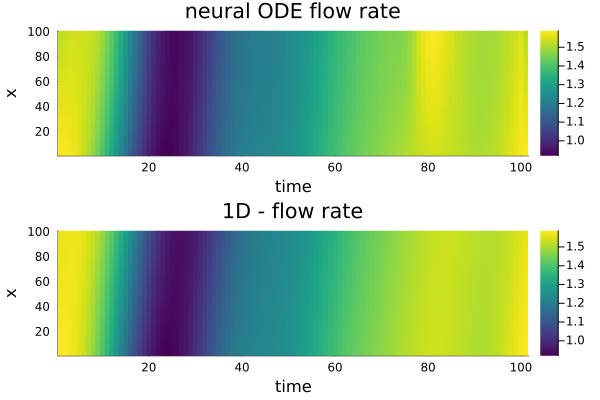

waveform batch: 5/6
Using ADAM optimizer
Sum of params:16.22382
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 41.63606242663822
Iteration: 2 || Loss: 42.10410014084219
Iteration: 3 || Loss: 38.642898716201444
Iteration: 4 || Loss: 35.234210429722694
Iteration: 5 || Loss: 35.70922706123794
Iteration: 6 || Loss: 35.234210429722694
saving ADAM checkpoint...
Sum of params:16.281792
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 35.234210429722694
Iteration: 2 || Loss: 35.18427288304473
Iteration: 3 || Loss: 25.691616223959038
Iteration: 4 || Loss: 19.69507462761231
Iteration: 5 || Loss: 14.564142622676084
Iteration: 6 || Loss: 12.805763149510852
Iteration: 7 || Loss: 11.950894477927443
Iteration: 8 || Loss: 11.334974497136617
Iteration: 9 || Loss: 10.112527733253383
Iteration: 10 || Loss: 9.41019101306274
Iteration: 11 || Loss: 9.070945910899031
Iteration: 12 || Loss: 9.019005777166473
Iteration: 13 || Loss: 9.001168312661848
Iteration:

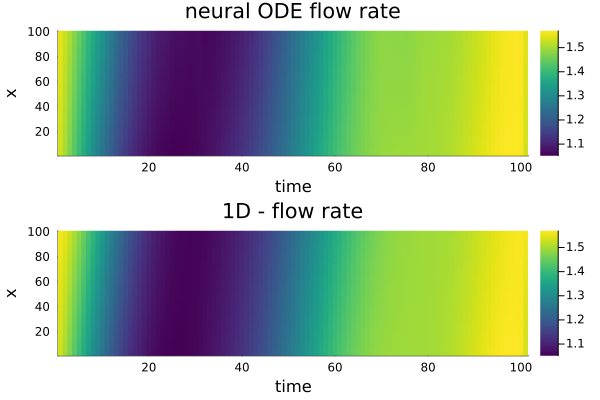

waveform batch: 6/6
Using ADAM optimizer
Sum of params:14.570655
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 78.14980335324589
Iteration: 2 || Loss: 95.6818318557944
Iteration: 3 || Loss: 73.61458746582888
Iteration: 4 || Loss: 72.50499565785003
Iteration: 5 || Loss: 75.89987261204446
Iteration: 6 || Loss: 72.50499565785003
saving ADAM checkpoint...
Sum of params:14.558382
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 72.50499565785003
Iteration: 2 || Loss: 69.52840482164486
Iteration: 3 || Loss: 42.894305533862024
Iteration: 4 || Loss: 27.693487217622213
Iteration: 5 || Loss: 27.202195521661395
Iteration: 6 || Loss: 21.77733587130524
Iteration: 7 || Loss: 20.696938026112154
Iteration: 8 || Loss: 16.47174675404417
Iteration: 9 || Loss: 16.03378225077458
Iteration: 10 || Loss: 15.624441004230139
Iteration: 11 || Loss: 15.434505574981786
Iteration: 12 || Loss: 15.23057059811634
Iteration: 13 || Loss: 15.193590977009094
Iteration: 1

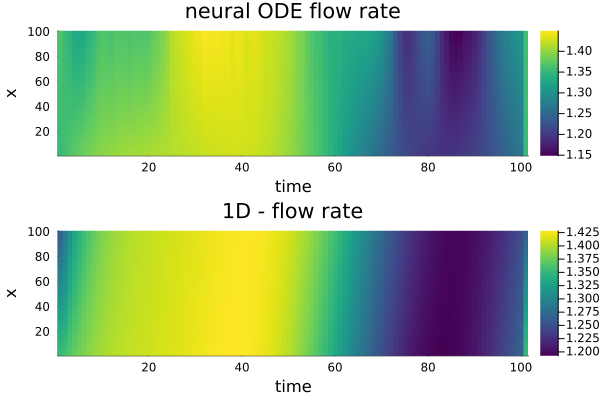

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Testing:
waveform batch: 1/4
Test loss:33.271702827159345


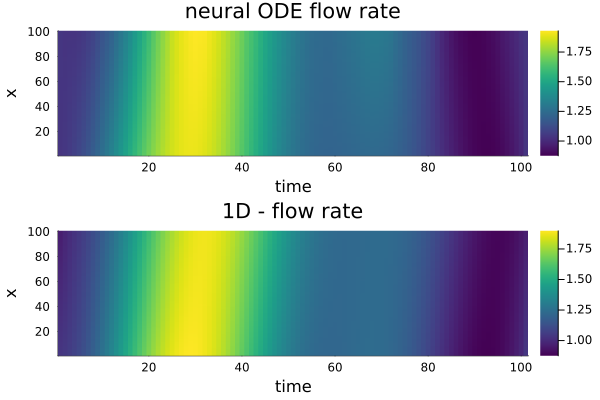

waveform batch: 2/4
Test loss:68.02289120497952


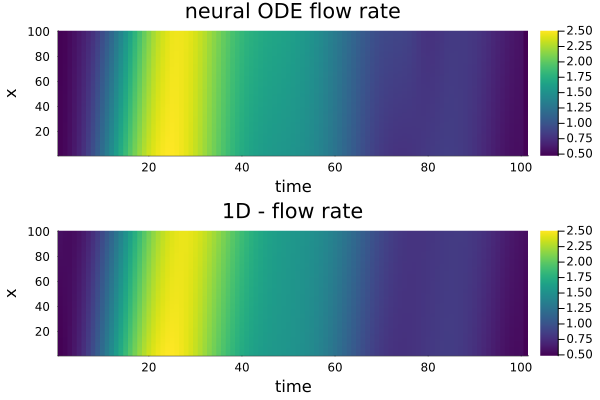

waveform batch: 3/4
Test loss:57.480494295055806


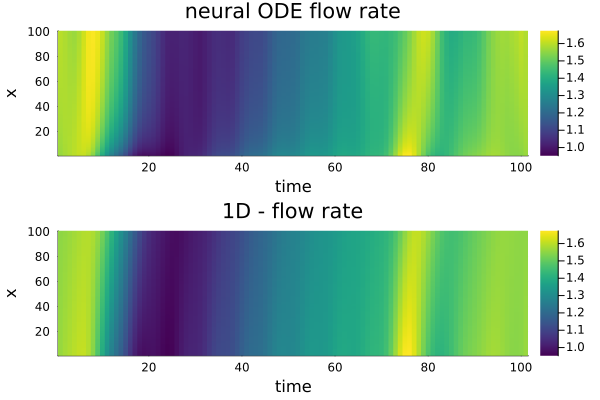

waveform batch: 4/4
Test loss:18.40544474268683


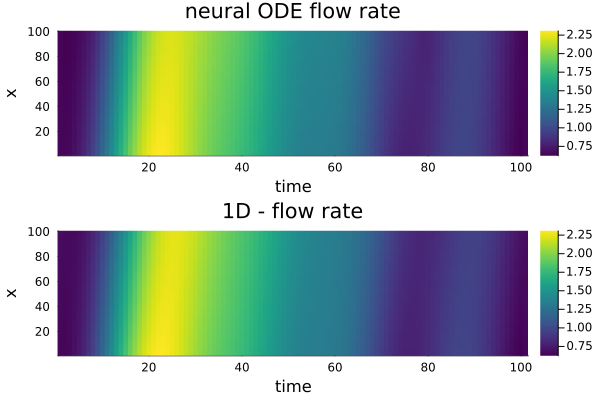

Epoch 4 mean loss loss:4.159320497748446
Start training epoch 5
waveform batch: 1/6
Using ADAM optimizer
Sum of params:15.7620945
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 84.083517788291
Iteration: 2 || Loss: 76.40625450108931
Iteration: 3 || Loss: 77.87884103570921
Iteration: 4 || Loss: 72.86960678252518
Iteration: 5 || Loss: 68.0312785617214
Iteration: 6 || Loss: 68.0312785617214
saving ADAM checkpoint...
Sum of params:15.69821
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 68.0312785617214
Iteration: 2 || Loss: 67.90719519278598
Iteration: 3 || Loss: 38.34037936807234
Iteration: 4 || Loss: 32.70660618774144
Iteration: 5 || Loss: 29.53934065673445
Iteration: 6 || Loss: 24.61518052006327
Iteration: 7 || Loss: 23.308970207656518
Iteration: 8 || Loss: 22.88599555711314
Iteration: 9 || Loss: 22.756404138934965
Iteration: 10 || Loss: 22.692106041019738
Iteration: 11 || Loss: 22.6119470159128
Iteration: 12 || Loss: 22.5754045350640

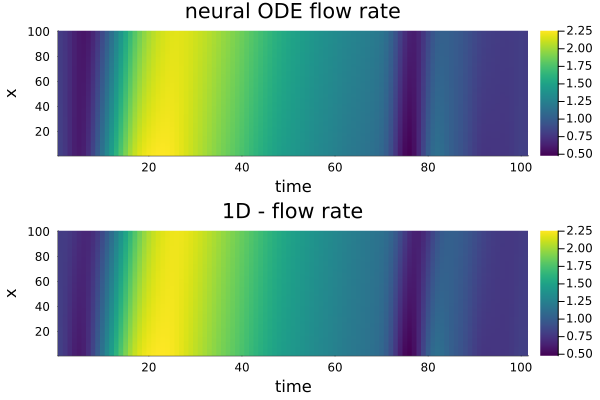

waveform batch: 2/6
Using ADAM optimizer
Sum of params:13.508845
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 68.34302506774284
Iteration: 2 || Loss: 71.37205052944438
Iteration: 3 || Loss: 66.5801129335027
Iteration: 4 || Loss: 63.130079188764576
Iteration: 5 || Loss: 65.31398560470694
Iteration: 6 || Loss: 63.130079188764576
saving ADAM checkpoint...
Sum of params:13.581755
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 63.130079188764576
Iteration: 2 || Loss: 63.00039283459237
Iteration: 3 || Loss: 57.15852967570108
Iteration: 4 || Loss: 47.08271448461612
Iteration: 5 || Loss: 40.100974565833305
Iteration: 6 || Loss: 38.43102774549236
Iteration: 7 || Loss: 37.63447095756053
Iteration: 8 || Loss: 37.46550791556506
Iteration: 9 || Loss: 37.171252913344865
Iteration: 10 || Loss: 36.83077907116562
Iteration: 11 || Loss: 36.74113378452316
Iteration: 12 || Loss: 36.71325663081521
Iteration: 13 || Loss: 36.69469327054418
Iteration: 14 

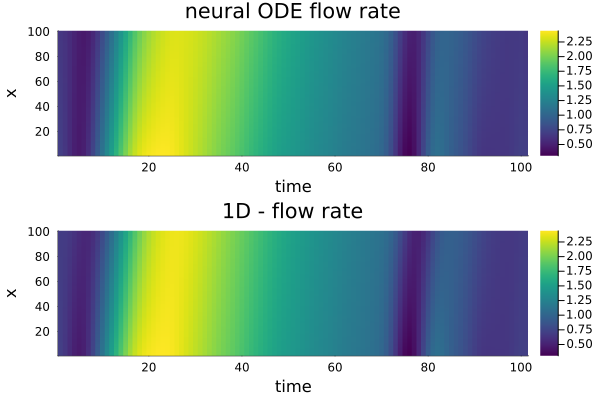

waveform batch: 3/6
Using ADAM optimizer
Sum of params:13.59805
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 125.94742742275041
Iteration: 2 || Loss: 118.64438749381532
Iteration: 3 || Loss: 120.31519032904127
Iteration: 4 || Loss: 111.7216669641084
Iteration: 5 || Loss: 107.33446662545266
Iteration: 6 || Loss: 107.33446662545266
saving ADAM checkpoint...
Sum of params:13.638086
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 107.33446662545266
Iteration: 2 || Loss: 106.85966544131925
Iteration: 3 || Loss: 79.0936207695593
Iteration: 4 || Loss: 53.50886797568475
Iteration: 5 || Loss: 45.52181493143803
Iteration: 6 || Loss: 34.72458632467566
Iteration: 7 || Loss: 29.283618981245745
Iteration: 8 || Loss: 28.342736081656724
Iteration: 9 || Loss: 27.85643925854814
Iteration: 10 || Loss: 27.758661144311933
Iteration: 11 || Loss: 27.727175951663927
Iteration: 12 || Loss: 27.698266470423853
Iteration: 13 || Loss: 27.674916757300775
Iterati

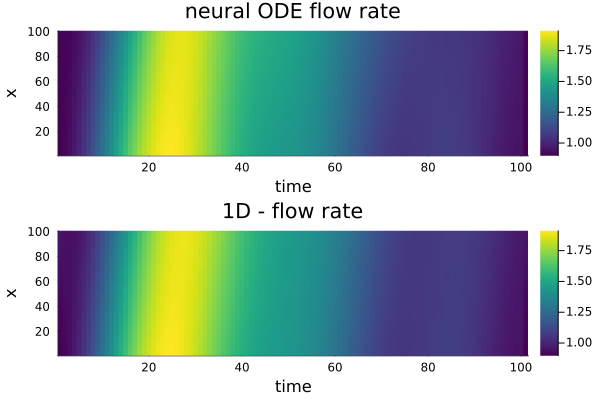

waveform batch: 4/6
Using ADAM optimizer
Sum of params:14.560038
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 70.0479141026853
Iteration: 2 || Loss: 74.28645971168734
Iteration: 3 || Loss: 65.86328855667395
Iteration: 4 || Loss: 62.018241534699385
Iteration: 5 || Loss: 63.73678986843906
Iteration: 6 || Loss: 62.018241534699385
saving ADAM checkpoint...
Sum of params:14.51516
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 62.018241534699385
Iteration: 2 || Loss: 61.65651477024279
Iteration: 3 || Loss: 48.35320110884823
Iteration: 4 || Loss: 43.44374508591984
Iteration: 5 || Loss: 38.62029465863146
Iteration: 6 || Loss: 34.5815414980589
Iteration: 7 || Loss: 31.642577474801115
Iteration: 8 || Loss: 29.808607753525237
Iteration: 9 || Loss: 29.056930256640683
Iteration: 10 || Loss: 28.808436864126236
Iteration: 11 || Loss: 28.735623732369007
Iteration: 12 || Loss: 28.680625161658828
Iteration: 13 || Loss: 28.592110232349494
Iteration: 

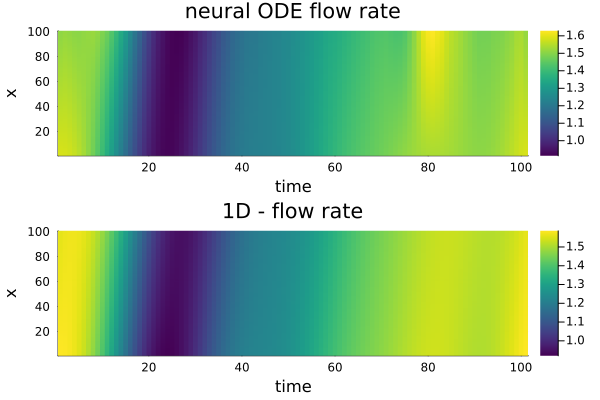

waveform batch: 5/6
Using ADAM optimizer
Sum of params:10.597441
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 31.0515992359283
Iteration: 2 || Loss: 62.57511119123545
Iteration: 3 || Loss: 31.284489050965934
Iteration: 4 || Loss: 37.792298162153536
Iteration: 5 || Loss: 47.94079101733064
Iteration: 6 || Loss: 31.0515992359283
saving ADAM checkpoint...
Sum of params:10.597441
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 31.0515992359283
Iteration: 2 || Loss: 30.986209905596613
Iteration: 3 || Loss: 24.019750529812377
Iteration: 4 || Loss: 18.225652095174706
Iteration: 5 || Loss: 7.932693679070928
Iteration: 6 || Loss: 6.904515247576798
Iteration: 7 || Loss: 6.733925998506991
Iteration: 8 || Loss: 6.679410101844818
Iteration: 9 || Loss: 6.663003585829901
Iteration: 10 || Loss: 6.638107333209018
Iteration: 11 || Loss: 6.6066508753926625
Iteration: 12 || Loss: 6.5742845101901475
Iteration: 13 || Loss: 6.541747476516196
Iteration: 14 

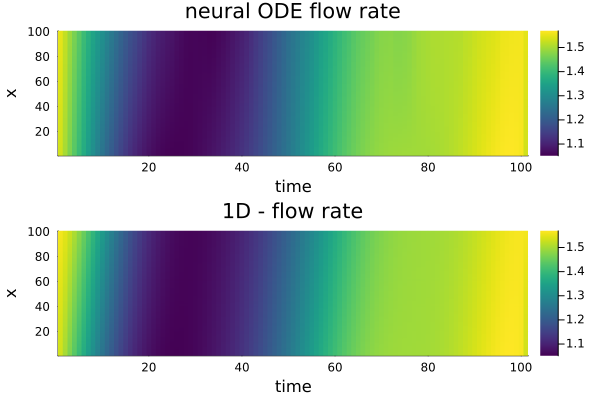

waveform batch: 6/6
Using ADAM optimizer
Sum of params:10.973945
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 40.27733928480268
Iteration: 2 || Loss: 37.34799828304126
Iteration: 3 || Loss: 37.99036119316408
Iteration: 4 || Loss: 33.19562165385983
Iteration: 5 || Loss: 32.57219617901224
Iteration: 6 || Loss: 32.57219617901224
saving ADAM checkpoint...
Sum of params:11.016168
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 32.57219617901224
Iteration: 2 || Loss: 32.28275346858995
Iteration: 3 || Loss: 28.351349492587246
Iteration: 4 || Loss: 25.180971215314447
Iteration: 5 || Loss: 20.772685010107285
Iteration: 6 || Loss: 16.186909363841224
Iteration: 7 || Loss: 14.8078557387798
Iteration: 8 || Loss: 13.993353341451684
Iteration: 9 || Loss: 13.738931293193687
Iteration: 10 || Loss: 13.677704604861928
Iteration: 11 || Loss: 13.63103026457267
Iteration: 12 || Loss: 13.595743485857234
Iteration: 13 || Loss: 13.48911876649886
Iteration: 

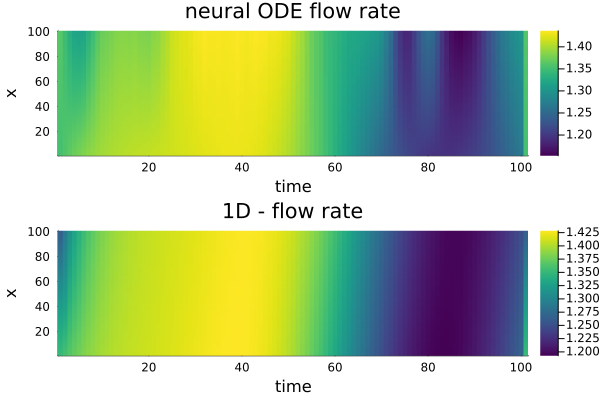

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Testing:
waveform batch: 1/4
Test loss:47.005689186787684


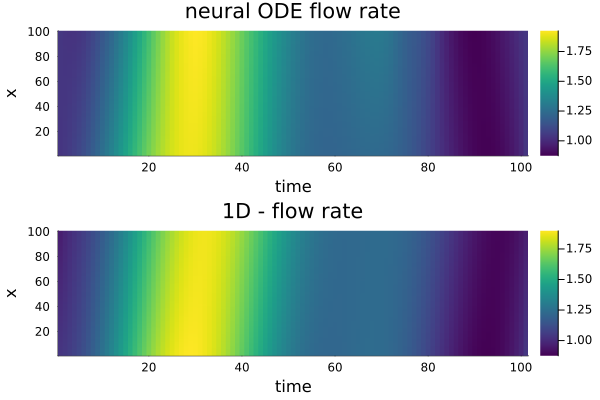

waveform batch: 2/4
Test loss:37.30527676582039


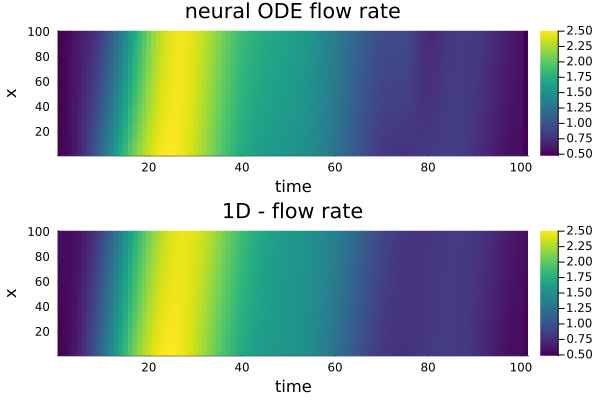

waveform batch: 3/4
Test loss:27.49042049679968


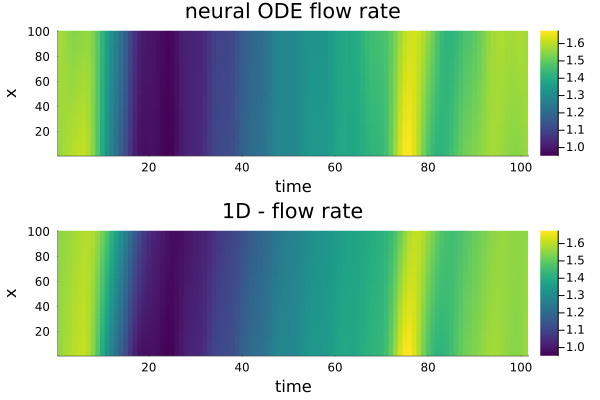

waveform batch: 4/4
Test loss:18.333694194687695


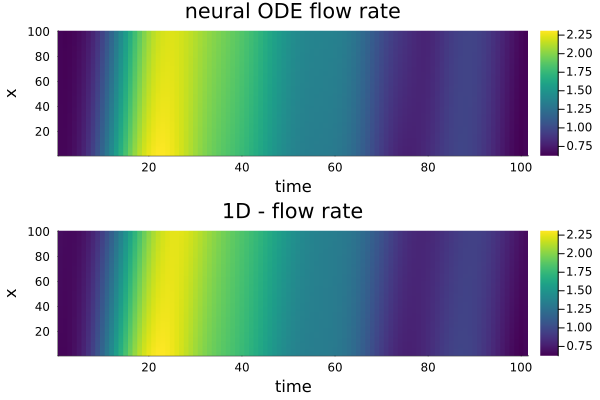

Epoch 5 mean loss loss:4.137928132357258
Start training epoch 6
waveform batch: 1/6
Using ADAM optimizer
Sum of params:11.297917
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 34.2465156195357
Iteration: 2 || Loss: 46.44318010363484
Iteration: 3 || Loss: 33.742996148806384
Iteration: 4 || Loss: 34.982579797570345
Iteration: 5 || Loss: 38.656862337377234
Iteration: 6 || Loss: 33.742996148806384
saving ADAM checkpoint...
Sum of params:11.318217
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 33.742996148806384
Iteration: 2 || Loss: 33.513945219971816
Iteration: 3 || Loss: 30.43948303457946
Iteration: 4 || Loss: 26.82678904599772
Iteration: 5 || Loss: 26.287747531632238
Iteration: 6 || Loss: 24.523807768072235
Iteration: 7 || Loss: 21.26986540859404
Iteration: 8 || Loss: 20.882070850701947
Iteration: 9 || Loss: 20.551784253809622
Iteration: 10 || Loss: 20.517163774420883
Iteration: 11 || Loss: 20.456637408773176
Iteration: 12 || Loss: 20

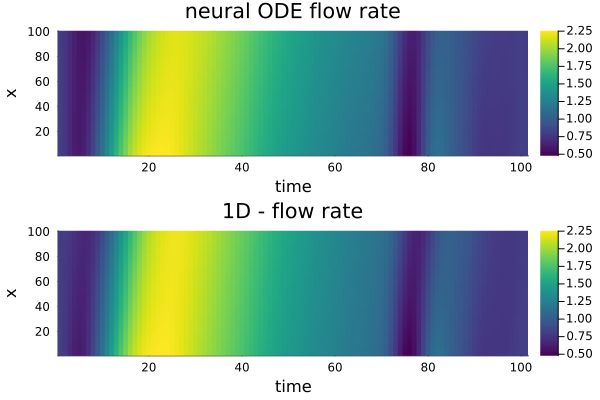

waveform batch: 2/6
Using ADAM optimizer
Sum of params:11.028854
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 67.84504521199487
Iteration: 2 || Loss: 70.56482421889599
Iteration: 3 || Loss: 65.32741280034216
Iteration: 4 || Loss: 59.54537240370511
Iteration: 5 || Loss: 61.41197499374368
Iteration: 6 || Loss: 59.54537240370511
saving ADAM checkpoint...
Sum of params:11.025504
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 59.54537240370511
Iteration: 2 || Loss: 59.44711383238476
Iteration: 3 || Loss: 52.460402602330774
Iteration: 4 || Loss: 45.21561741337078
Iteration: 5 || Loss: 40.92204699434018
Iteration: 6 || Loss: 37.00469635217296
Iteration: 7 || Loss: 36.71669862779754
Iteration: 8 || Loss: 36.7002709804654
Iteration: 9 || Loss: 36.694387797549346
Iteration: 10 || Loss: 36.68411629589875
Iteration: 11 || Loss: 36.6749749982087
Iteration: 12 || Loss: 36.66090882769938
Iteration: 13 || Loss: 36.606425612483314
Iteration: 14 || 

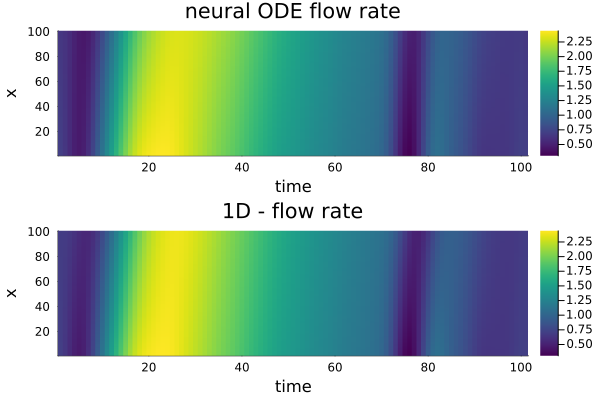

waveform batch: 3/6
Using ADAM optimizer
Sum of params:10.532594
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 113.57435609899478
Iteration: 2 || Loss: 87.1460993532807
Iteration: 3 || Loss: 103.06208969186329
Iteration: 4 || Loss: 96.71534601149062
Iteration: 5 || Loss: 84.46445131298003
Iteration: 6 || Loss: 84.46445131298003
saving ADAM checkpoint...
Sum of params:10.58278
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 84.46445131298003
Iteration: 2 || Loss: 81.64800365671604
Iteration: 3 || Loss: 60.040579510065406
Iteration: 4 || Loss: 50.38488335447389
Iteration: 5 || Loss: 48.806712455133905
Iteration: 6 || Loss: 44.71116584012982
Iteration: 7 || Loss: 36.590266341989235
Iteration: 8 || Loss: 32.37654533264853
Iteration: 9 || Loss: 31.508229229696312
Iteration: 10 || Loss: 30.39886770667641
Iteration: 11 || Loss: 29.3376133709174
Iteration: 12 || Loss: 29.10150565584252
Iteration: 13 || Loss: 28.143695263075543
Iteration: 14 

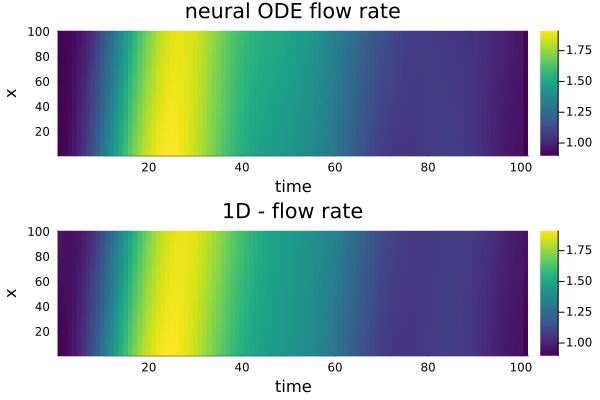

waveform batch: 4/6
Using ADAM optimizer
Sum of params:11.121766
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 51.48552567730014
Iteration: 2 || Loss: 57.47055148491794
Iteration: 3 || Loss: 49.02790459087175
Iteration: 4 || Loss: 48.4020992963365
Iteration: 5 || Loss: 50.53755968149787
Iteration: 6 || Loss: 48.4020992963365
saving ADAM checkpoint...
Sum of params:11.16697
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 48.4020992963365
Iteration: 2 || Loss: 46.88654735274016
Iteration: 3 || Loss: 38.39528254843085
Iteration: 4 || Loss: 35.603176818270306
Iteration: 5 || Loss: 34.370558053799655
Iteration: 6 || Loss: 32.06276186448845
Iteration: 7 || Loss: 29.3569974579178
Iteration: 8 || Loss: 27.228392188481735
Iteration: 9 || Loss: 26.031059635520567
Iteration: 10 || Loss: 25.802770279267477
Iteration: 11 || Loss: 25.775689501664623
Iteration: 12 || Loss: 25.73585273392324
Iteration: 13 || Loss: 25.726277255106076
Iteration: 14 ||

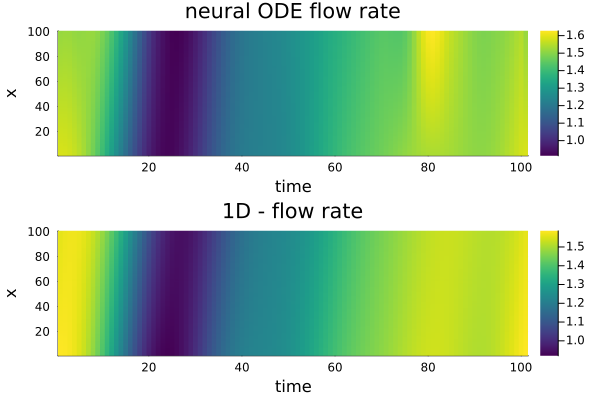

waveform batch: 5/6
Using ADAM optimizer
Sum of params:10.803316
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 56.96682457113341
Iteration: 2 || Loss: 35.907138897600376
Iteration: 3 || Loss: 48.412947563523936
Iteration: 4 || Loss: 44.25995198202572
Iteration: 5 || Loss: 34.80468884770396
Iteration: 6 || Loss: 34.80468884770396
saving ADAM checkpoint...
Sum of params:10.80499
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 34.80468884770396
Iteration: 2 || Loss: 32.43928154456975
Iteration: 3 || Loss: 24.420286063195952
Iteration: 4 || Loss: 22.10355742882805
Iteration: 5 || Loss: 21.14169891555231
Iteration: 6 || Loss: 12.46136372097294
Iteration: 7 || Loss: 9.421673277907729
Iteration: 8 || Loss: 6.842811681979384
Iteration: 9 || Loss: 6.703481510480364
Iteration: 10 || Loss: 6.610533420156415
Iteration: 11 || Loss: 6.5554163845355395
Iteration: 12 || Loss: 6.542875615237942
Iteration: 13 || Loss: 6.519934830848365
Iteration: 14 |

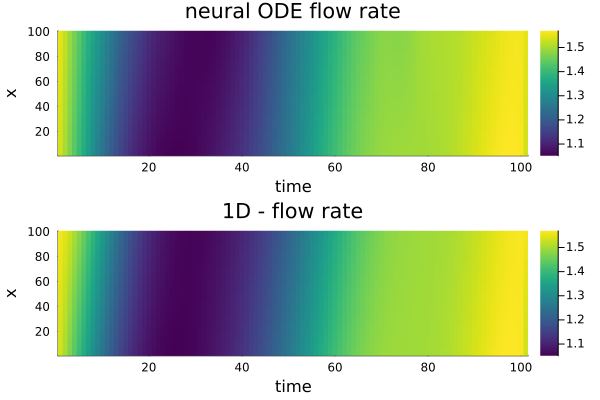

waveform batch: 6/6
Using ADAM optimizer
Sum of params:11.069806
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 54.48232764969934
Iteration: 2 || Loss: 39.848165119412464
Iteration: 3 || Loss: 48.36134499086609
Iteration: 4 || Loss: 43.57709883803312
Iteration: 5 || Loss: 36.50355454108659
Iteration: 6 || Loss: 36.50355454108659
saving ADAM checkpoint...
Sum of params:11.106693
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 36.50355454108659
Iteration: 2 || Loss: 35.39439232437012
Iteration: 3 || Loss: 27.08482661793502
Iteration: 4 || Loss: 24.449859735065882
Iteration: 5 || Loss: 23.062325288770765
Iteration: 6 || Loss: 14.373195952113592
Iteration: 7 || Loss: 13.09781652351382
Iteration: 8 || Loss: 11.89194902165515
Iteration: 9 || Loss: 11.637322809178041
Iteration: 10 || Loss: 11.307251222610688
Iteration: 11 || Loss: 11.263301383376199
Iteration: 12 || Loss: 11.230469306085698
Iteration: 13 || Loss: 11.227191046874102
Iteration

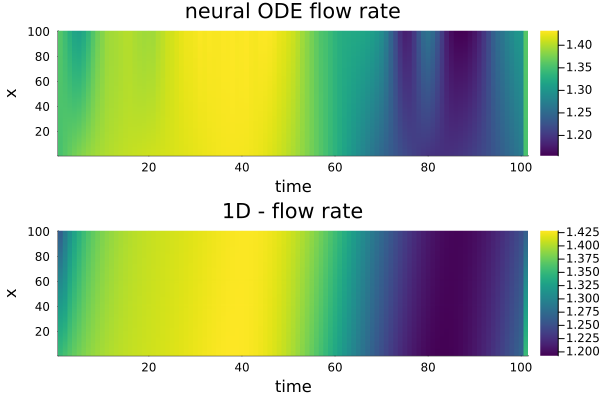

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Testing:
waveform batch: 1/4
Test loss:32.4384725841675


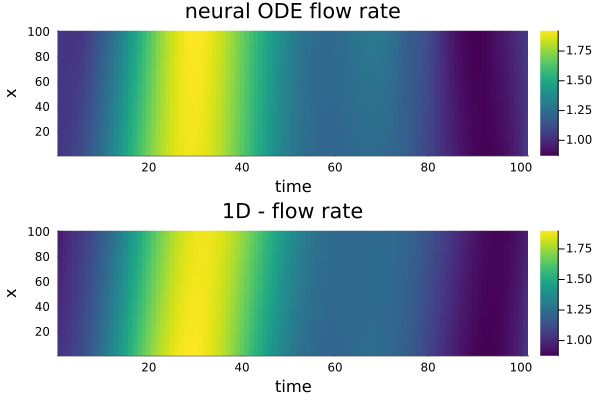

waveform batch: 2/4
Test loss:34.11892894703998


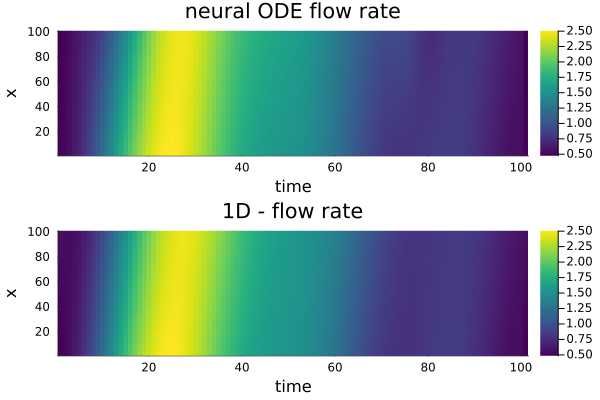

waveform batch: 3/4
Test loss:24.747371244902233


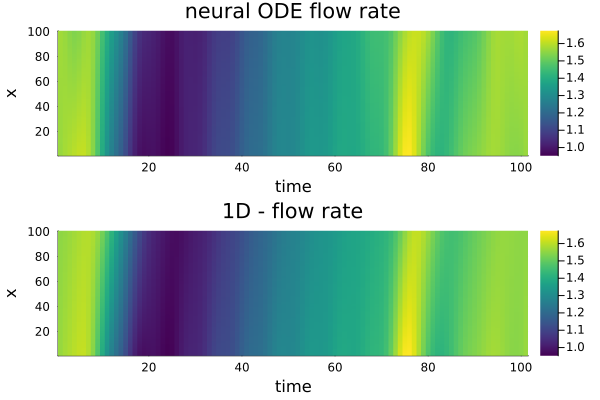

waveform batch: 4/4
Test loss:18.76605957540172


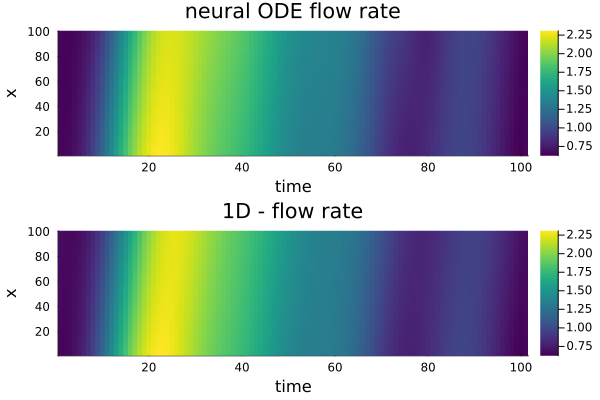

Epoch 6 mean loss loss:4.1231260758516415
Start training epoch 7
waveform batch: 1/6
Using ADAM optimizer
Sum of params:11.018657
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 33.44653422120874
Iteration: 2 || Loss: 62.47150500855008
Iteration: 3 || Loss: 34.080695725613744
Iteration: 4 || Loss: 39.87068230172718
Iteration: 5 || Loss: 49.46122911230976
Iteration: 6 || Loss: 33.44653422120874
saving ADAM checkpoint...
Sum of params:11.018657
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 33.44653422120874
Iteration: 2 || Loss: 33.38145785234942
Iteration: 3 || Loss: 30.777513116791575
Iteration: 4 || Loss: 25.798160189099963
Iteration: 5 || Loss: 20.93693191848313
Iteration: 6 || Loss: 20.408242968395435
Iteration: 7 || Loss: 20.273276255906985
Iteration: 8 || Loss: 20.19714525403428
Iteration: 9 || Loss: 20.152638814374036
Iteration: 10 || Loss: 20.12456592505218
Iteration: 11 || Loss: 20.109075701498618
Iteration: 12 || Loss: 20.10

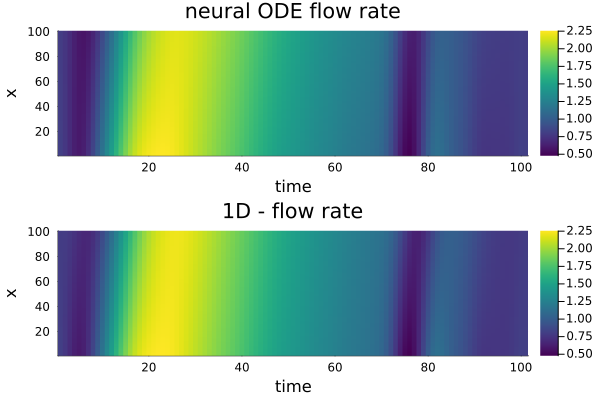

waveform batch: 2/6
Using ADAM optimizer
Sum of params:10.816641
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 58.66184075866293
Iteration: 2 || Loss: 66.68652760003981
Iteration: 3 || Loss: 57.05952477133339
Iteration: 4 || Loss: 53.77181309278674
Iteration: 5 || Loss: 58.48608772591264
Iteration: 6 || Loss: 53.77181309278674
saving ADAM checkpoint...
Sum of params:10.842037
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 53.77181309278674
Iteration: 2 || Loss: 53.06299935291203
Iteration: 3 || Loss: 43.37914917644966
Iteration: 4 || Loss: 40.434861333008946
Iteration: 5 || Loss: 39.475642948730304
Iteration: 6 || Loss: 38.19709462548694
Iteration: 7 || Loss: 37.70040349160013
Iteration: 8 || Loss: 37.1327297957999
Iteration: 9 || Loss: 36.677553741893
Iteration: 10 || Loss: 36.38990630892363
Iteration: 11 || Loss: 36.16905197235829
Iteration: 12 || Loss: 36.13354232694711
Iteration: 13 || Loss: 36.11004093936034
Iteration: 14 || Lo

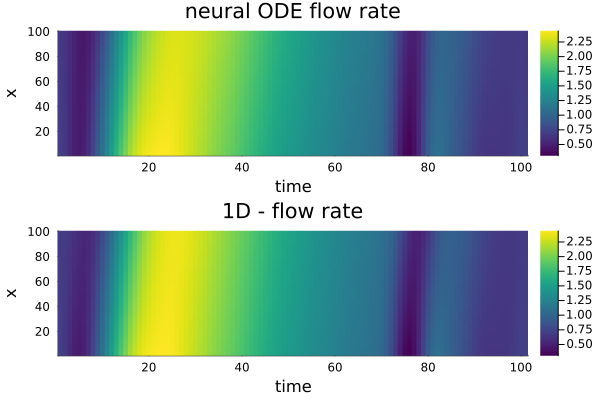

waveform batch: 3/6
Using ADAM optimizer
Sum of params:10.79177
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 79.57326695725249
Iteration: 2 || Loss: 74.71641854675383
Iteration: 3 || Loss: 76.3692162953798
Iteration: 4 || Loss: 68.06927231777118
Iteration: 5 || Loss: 66.77183170468004
Iteration: 6 || Loss: 66.77183170468004
saving ADAM checkpoint...
Sum of params:10.84283
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 66.77183170468004
Iteration: 2 || Loss: 65.91023782787369
Iteration: 3 || Loss: 52.88051119951282
Iteration: 4 || Loss: 44.948863467831806
Iteration: 5 || Loss: 42.35112256989911
Iteration: 6 || Loss: 31.791986780393124
Iteration: 7 || Loss: 28.585692300142732
Iteration: 8 || Loss: 28.09790874991039
Iteration: 9 || Loss: 27.04536851745852
Iteration: 10 || Loss: 26.698754840124643
Iteration: 11 || Loss: 26.35081715573032
Iteration: 12 || Loss: 26.305928735988125
Iteration: 13 || Loss: 26.263176812070242
Iteration: 14 |

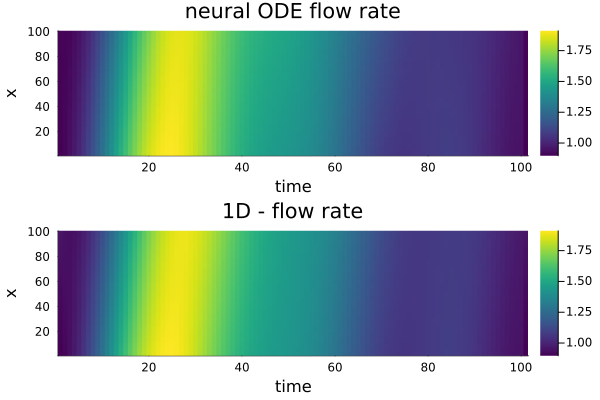

waveform batch: 4/6
Using ADAM optimizer
Sum of params:11.265186
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 44.000577826922644
Iteration: 2 || Loss: 57.33187259477037
Iteration: 3 || Loss: 43.04637696948463
Iteration: 4 || Loss: 43.95351530184225
Iteration: 5 || Loss: 48.35519365049474
Iteration: 6 || Loss: 43.04637696948463
saving ADAM checkpoint...
Sum of params:11.293872
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 43.04637696948463
Iteration: 2 || Loss: 41.69274524060306
Iteration: 3 || Loss: 36.18220611745966
Iteration: 4 || Loss: 35.26419048035857
Iteration: 5 || Loss: 29.51983611088143
Iteration: 6 || Loss: 27.184485355023668
Iteration: 7 || Loss: 26.34841119097985
Iteration: 8 || Loss: 26.248782656811144
Iteration: 9 || Loss: 26.14835109154061
Iteration: 10 || Loss: 26.120396914063758
Iteration: 11 || Loss: 26.11405705670139
Iteration: 12 || Loss: 26.102143254266778
Iteration: 13 || Loss: 26.09174423584154
Iteration: 14

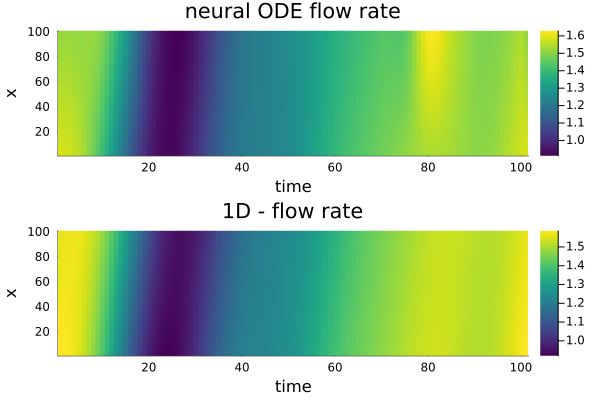

waveform batch: 5/6
Using ADAM optimizer
Sum of params:11.276066
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 34.290767806852166
Iteration: 2 || Loss: 34.122612109049584
Iteration: 3 || Loss: 31.87708647449133
Iteration: 4 || Loss: 27.12508803994858
Iteration: 5 || Loss: 28.01107721255723
Iteration: 6 || Loss: 27.12508803994858
saving ADAM checkpoint...
Sum of params:11.277037
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 27.12508803994858
Iteration: 2 || Loss: 26.996594978834416
Iteration: 3 || Loss: 21.44997120658491
Iteration: 4 || Loss: 14.167361101439601
Iteration: 5 || Loss: 11.488725146492607
Iteration: 6 || Loss: 8.613844083993644
Iteration: 7 || Loss: 6.61183694165529
Iteration: 8 || Loss: 6.467552529165378
Iteration: 9 || Loss: 6.4594847271394595
Iteration: 10 || Loss: 6.455241632607295
Iteration: 11 || Loss: 6.451328541687383
Iteration: 12 || Loss: 6.438434100922061
Iteration: 13 || Loss: 6.381200699529789
Iteration: 14

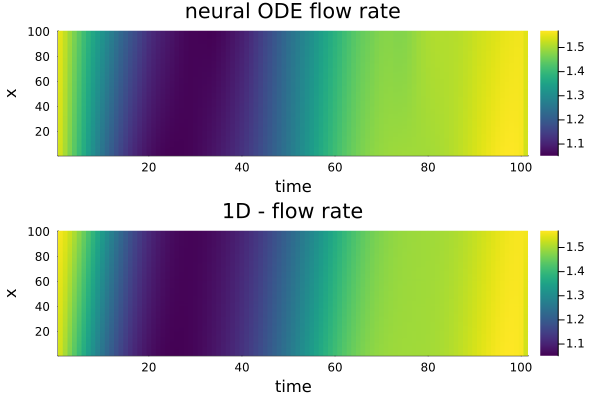

waveform batch: 6/6
Using ADAM optimizer
Sum of params:11.296003
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 72.7489389524757
Iteration: 2 || Loss: 75.7142801311681
Iteration: 3 || Loss: 70.26679497180344
Iteration: 4 || Loss: 65.80183836599315
Iteration: 5 || Loss: 67.707169058594
Iteration: 6 || Loss: 65.80183836599315
saving ADAM checkpoint...
Sum of params:11.3289585
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 65.80183836599315
Iteration: 2 || Loss: 65.71872626448976
Iteration: 3 || Loss: 31.366925695528785
Iteration: 4 || Loss: 24.978467096606092
Iteration: 5 || Loss: 18.06076265821963
Iteration: 6 || Loss: 15.90419723582908
Iteration: 7 || Loss: 14.281487141718948
Iteration: 8 || Loss: 13.042578856703312
Iteration: 9 || Loss: 12.868574657630344
Iteration: 10 || Loss: 12.822113932510296
Iteration: 11 || Loss: 12.629426962160672
Iteration: 12 || Loss: 12.330068843461055
Iteration: 13 || Loss: 12.20122295863547
Iteration: 14

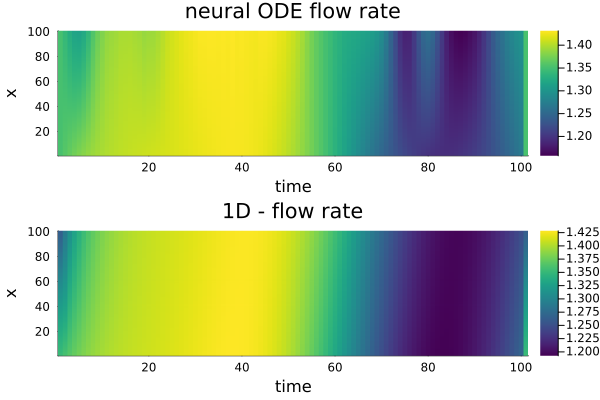

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Testing:
waveform batch: 1/4
Test loss:33.08843530465317


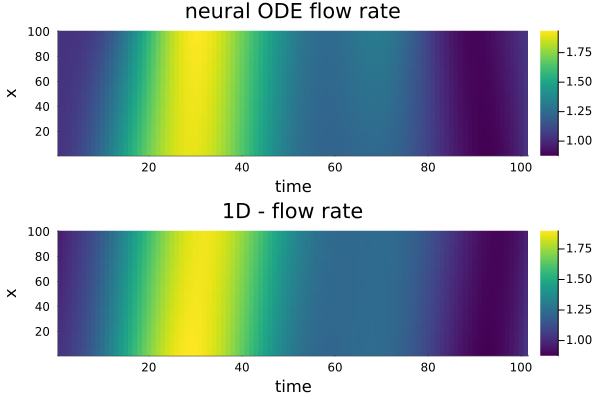

waveform batch: 2/4
Test loss:32.37284844649338


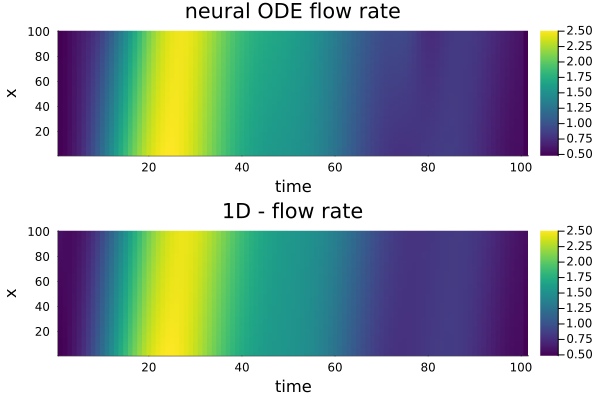

waveform batch: 3/4
Test loss:25.96789832454762


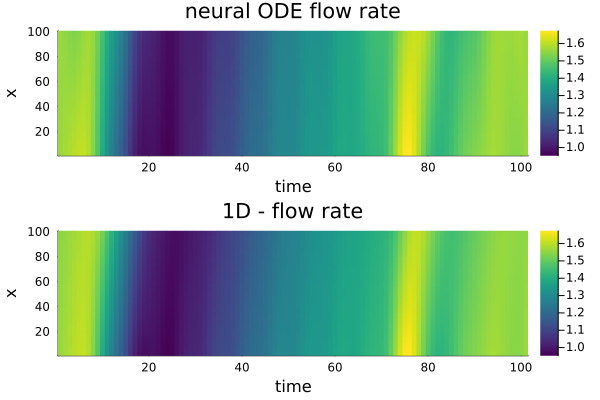

waveform batch: 4/4
Test loss:22.84327213914177


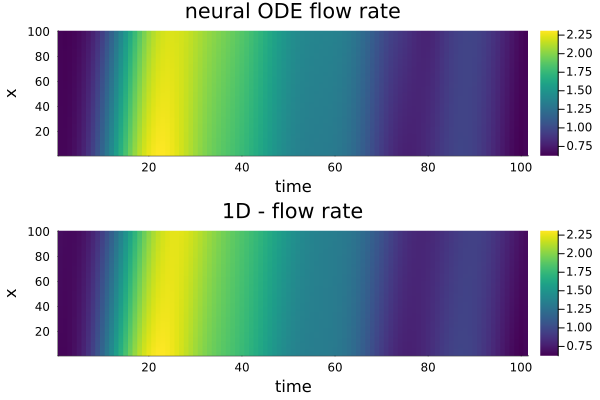

Epoch 7 mean loss loss:4.0739969241904435
Start training epoch 8
waveform batch: 1/6
Using ADAM optimizer
Sum of params:11.45235
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 35.33976801879434
Iteration: 2 || Loss: 46.56604830042415
Iteration: 3 || Loss: 34.353923619904684
Iteration: 4 || Loss: 32.926298993514415
Iteration: 5 || Loss: 37.79865238612647
Iteration: 6 || Loss: 32.926298993514415
saving ADAM checkpoint...
Sum of params:11.464708
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 32.926298993514415
Iteration: 2 || Loss: 31.55391431599952
Iteration: 3 || Loss: 29.739062452985397
Iteration: 4 || Loss: 28.673133110079913
Iteration: 5 || Loss: 26.95885741891341
Iteration: 6 || Loss: 24.439118295148617
Iteration: 7 || Loss: 23.38312570885827
Iteration: 8 || Loss: 21.988601506318094
Iteration: 9 || Loss: 21.818963712832527
Iteration: 10 || Loss: 21.77208920560217
Iteration: 11 || Loss: 21.675533391515657
Iteration: 12 || Loss: 21.

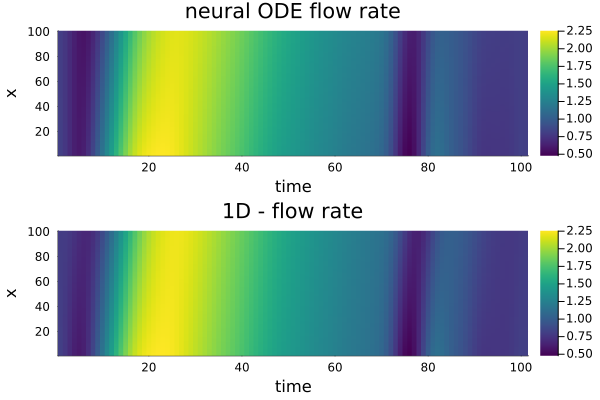

waveform batch: 2/6
Using ADAM optimizer
Sum of params:11.375831
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 50.0803104954698
Iteration: 2 || Loss: 67.6957056097016
Iteration: 3 || Loss: 50.13516268710732
Iteration: 4 || Loss: 52.244615056459885
Iteration: 5 || Loss: 57.85369924219616
Iteration: 6 || Loss: 50.0803104954698
saving ADAM checkpoint...
Sum of params:11.375831
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 50.0803104954698
Iteration: 2 || Loss: 49.51138673518273
Iteration: 3 || Loss: 45.151645642762055
Iteration: 4 || Loss: 43.53693736073072
Iteration: 5 || Loss: 40.91711374189554
Iteration: 6 || Loss: 38.33718660999918
Iteration: 7 || Loss: 37.13365450503194
Iteration: 8 || Loss: 36.69055925082388
Iteration: 9 || Loss: 36.606434609629964
Iteration: 10 || Loss: 36.52251070667768
Iteration: 11 || Loss: 36.48468598074989
Iteration: 12 || Loss: 36.436107717911504
Iteration: 13 || Loss: 36.42509281344858
Iteration: 14 || L

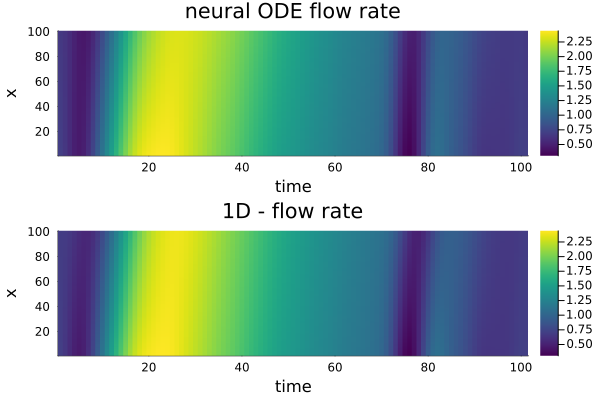

waveform batch: 3/6
Using ADAM optimizer
Sum of params:11.068027
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 50.749332398794195
Iteration: 2 || Loss: 74.11904342706987
Iteration: 3 || Loss: 50.90731915099331
Iteration: 4 || Loss: 53.887233261202844
Iteration: 5 || Loss: 61.5221949547285
Iteration: 6 || Loss: 50.749332398794195
saving ADAM checkpoint...
Sum of params:11.068027
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 50.749332398794195
Iteration: 2 || Loss: 49.818551219954244
Iteration: 3 || Loss: 44.4352875868141
Iteration: 4 || Loss: 41.307210303139726
Iteration: 5 || Loss: 35.07097822859224
Iteration: 6 || Loss: 32.491032131562946
Iteration: 7 || Loss: 29.667848023053462
Iteration: 8 || Loss: 28.67399761573145
Iteration: 9 || Loss: 28.05775820818703
Iteration: 10 || Loss: 27.368986517976566
Iteration: 11 || Loss: 27.266563857599085
Iteration: 12 || Loss: 27.118731580217897
Iteration: 13 || Loss: 27.0901864132187
Iteration:

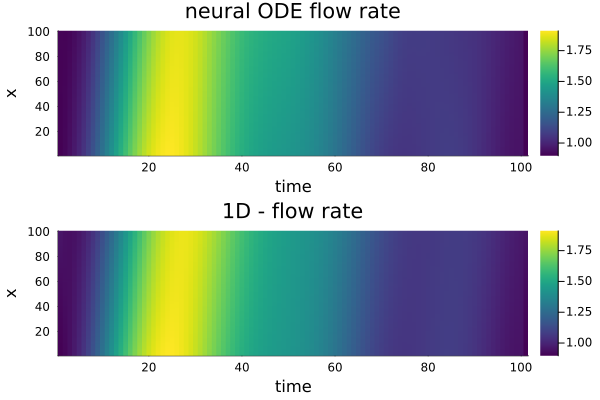

waveform batch: 4/6
Using ADAM optimizer
Sum of params:11.671243
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 50.49707803794073
Iteration: 2 || Loss: 51.47120292169053
Iteration: 3 || Loss: 48.22045879992968
Iteration: 4 || Loss: 44.288545987904484
Iteration: 5 || Loss: 45.598963342711
Iteration: 6 || Loss: 44.288545987904484
saving ADAM checkpoint...
Sum of params:11.714995
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 44.288545987904484
Iteration: 2 || Loss: 44.27213566743761
Iteration: 3 || Loss: 41.48778699753205
Iteration: 4 || Loss: 32.43103344077089
Iteration: 5 || Loss: 29.99970022480027
Iteration: 6 || Loss: 27.774964365281118
Iteration: 7 || Loss: 26.91167589546711
Iteration: 8 || Loss: 26.86820600657689
Iteration: 9 || Loss: 26.83476323443564
Iteration: 10 || Loss: 26.77755351940429
Iteration: 11 || Loss: 26.659753649008945
Iteration: 12 || Loss: 26.48111752765551
Iteration: 13 || Loss: 26.293736077295694
Iteration: 14 

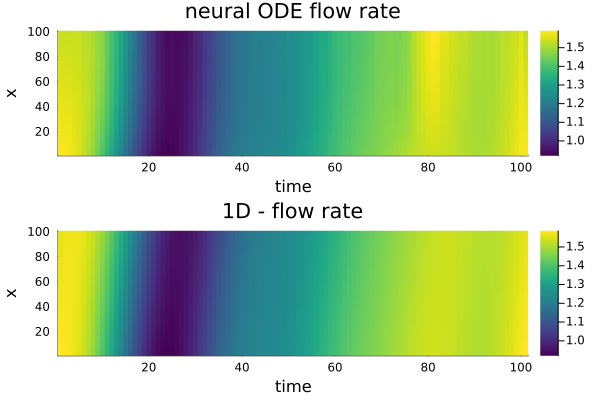

waveform batch: 5/6
Using ADAM optimizer
Sum of params:11.373227
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 84.68526595733172
Iteration: 2 || Loss: 62.92192343862031
Iteration: 3 || Loss: 65.1721677515629
Iteration: 4 || Loss: 70.75203156071524
Iteration: 5 || Loss: 68.58223937383929
Iteration: 6 || Loss: 62.92192343862031
saving ADAM checkpoint...
Sum of params:11.415527
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 62.92192343862031
Iteration: 2 || Loss: 62.32457876294886
Iteration: 3 || Loss: 45.04659144348089
Iteration: 4 || Loss: 36.90680973871294
Iteration: 5 || Loss: 33.503475463584344
Iteration: 6 || Loss: 28.66859070909131
Iteration: 7 || Loss: 25.81515674664745
Iteration: 8 || Loss: 19.222795679987115
Iteration: 9 || Loss: 15.481665957572938
Iteration: 10 || Loss: 14.549831112718381
Iteration: 11 || Loss: 14.099135941343178
Iteration: 12 || Loss: 13.672530777329452
Iteration: 13 || Loss: 13.320962204577116
Iteration: 1

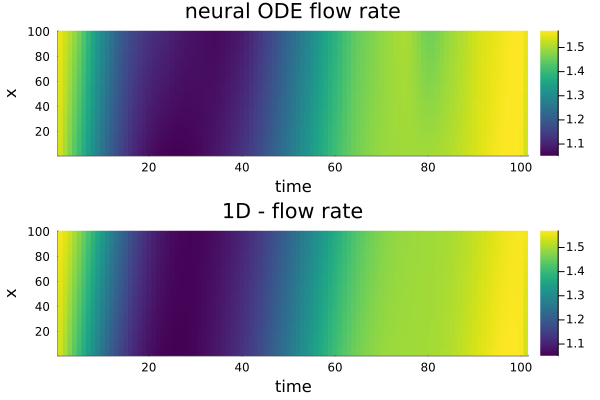

waveform batch: 6/6
Using ADAM optimizer
Sum of params:12.183652
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 53.05653603788147
Iteration: 2 || Loss: 31.028002854366704
Iteration: 3 || Loss: 42.05837801531234
Iteration: 4 || Loss: 41.9354814046038
Iteration: 5 || Loss: 33.64201970533991
Iteration: 6 || Loss: 31.028002854366704
saving ADAM checkpoint...
Sum of params:12.227552
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 31.028002854366704
Iteration: 2 || Loss: 30.869884281167256
Iteration: 3 || Loss: 27.082325532714222
Iteration: 4 || Loss: 22.0219526459622
Iteration: 5 || Loss: 16.267351454545466
Iteration: 6 || Loss: 15.492561090546946
Iteration: 7 || Loss: 15.351481214441181
Iteration: 8 || Loss: 15.281704148515106
Iteration: 9 || Loss: 15.255462714386557
Iteration: 10 || Loss: 15.203125089505205
Iteration: 11 || Loss: 15.081362299555263
Iteration: 12 || Loss: 14.84361614218315
Iteration: 13 || Loss: 14.689095057661865
Iterati

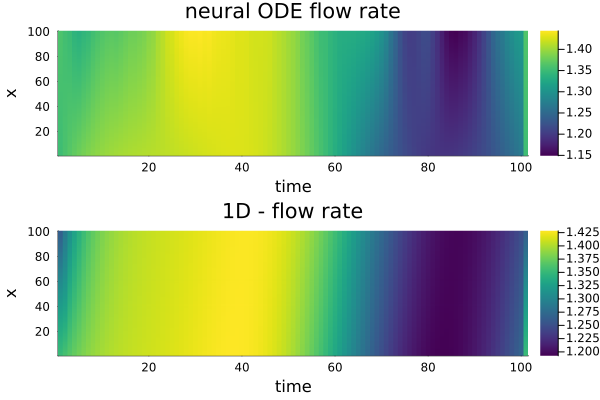

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Testing:
waveform batch: 1/4
Test loss:34.47184592525268


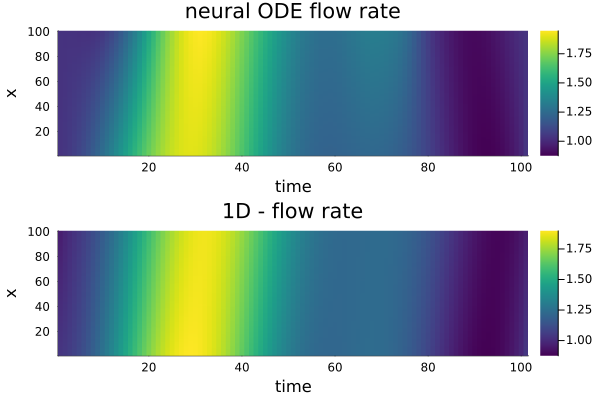

waveform batch: 2/4
Test loss:49.426125633760655


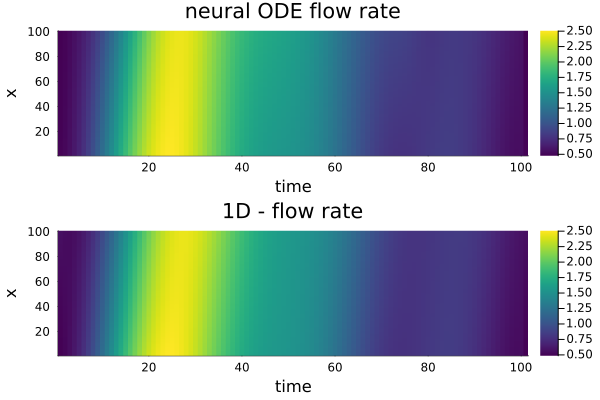

waveform batch: 3/4
Test loss:48.565347203531886


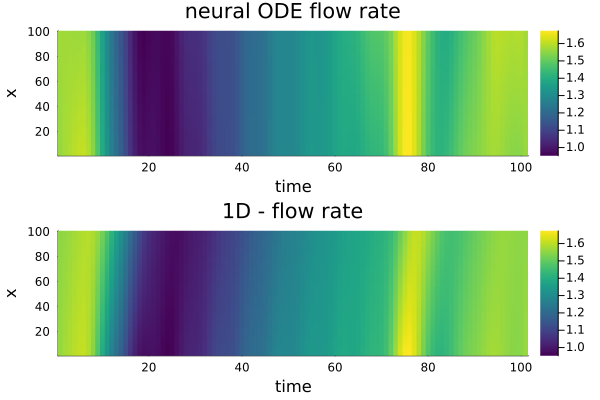

waveform batch: 4/4
Test loss:21.298437716076197


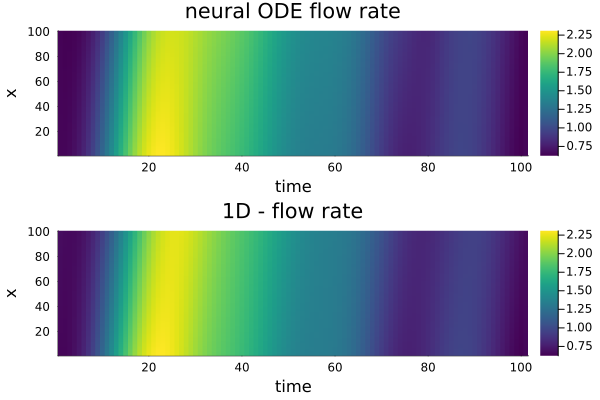

Epoch 8 mean loss loss:3.9815999581779113
Start training epoch 9
waveform batch: 1/6
Using ADAM optimizer
Sum of params:12.35844
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 50.29100684729857
Iteration: 2 || Loss: 66.20894135158463
Iteration: 3 || Loss: 48.73260232773569
Iteration: 4 || Loss: 55.085782097176754
Iteration: 5 || Loss: 58.09875918985497
Iteration: 6 || Loss: 48.73260232773569
saving ADAM checkpoint...
Sum of params:12.405681
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 48.73260232773569
Iteration: 2 || Loss: 48.45324542191609
Iteration: 3 || Loss: 42.777327652775355
Iteration: 4 || Loss: 40.49647340284184
Iteration: 5 || Loss: 36.60513118918132
Iteration: 6 || Loss: 29.701230779427075
Iteration: 7 || Loss: 28.748171427105557
Iteration: 8 || Loss: 28.347467337860312
Iteration: 9 || Loss: 28.024952385051733
Iteration: 10 || Loss: 27.743391389248405
Iteration: 11 || Loss: 27.556046450859
Iteration: 12 || Loss: 27.00778

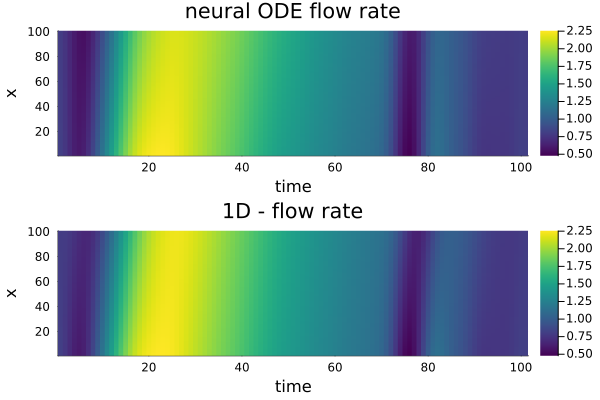

waveform batch: 2/6
Using ADAM optimizer
Sum of params:12.318995
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 112.61367181955504
Iteration: 2 || Loss: 92.9495492622236
Iteration: 3 || Loss: 103.10364584992877
Iteration: 4 || Loss: 98.44945080430223
Iteration: 5 || Loss: 89.07104529288131
Iteration: 6 || Loss: 89.07104529288131
saving ADAM checkpoint...
Sum of params:12.33535
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 89.07104529288131
Iteration: 2 || Loss: 86.24594151186416
Iteration: 3 || Loss: 66.11477491177934
Iteration: 4 || Loss: 60.965925462361376
Iteration: 5 || Loss: 59.75627468305705
Iteration: 6 || Loss: 55.946554310628066
Iteration: 7 || Loss: 49.07424457160556
Iteration: 8 || Loss: 46.27775897058814
Iteration: 9 || Loss: 42.08541244882109
Iteration: 10 || Loss: 40.647192006349925
Iteration: 11 || Loss: 40.46104877756257
Iteration: 12 || Loss: 40.2537483642652
Iteration: 13 || Loss: 40.165777180948346
Iteration: 14 |

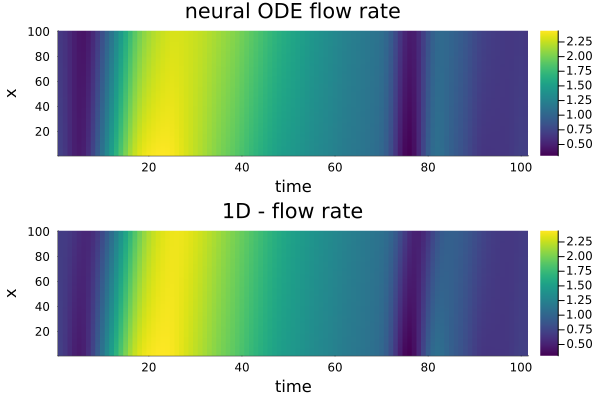

waveform batch: 3/6
Using ADAM optimizer
Sum of params:12.420885
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 79.41511764182516
Iteration: 2 || Loss: 63.88265052722156
Iteration: 3 || Loss: 72.30963348474342
Iteration: 4 || Loss: 69.35360105578086
Iteration: 5 || Loss: 62.26105783818706
Iteration: 6 || Loss: 62.26105783818706
saving ADAM checkpoint...
Sum of params:12.4752445
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 62.26105783818706
Iteration: 2 || Loss: 60.20425758192572
Iteration: 3 || Loss: 48.371537018038886
Iteration: 4 || Loss: 43.1390679254366
Iteration: 5 || Loss: 42.04140274368514
Iteration: 6 || Loss: 37.9886172541026
Iteration: 7 || Loss: 32.799649987484855
Iteration: 8 || Loss: 30.366219470328964
Iteration: 9 || Loss: 27.851524064510777
Iteration: 10 || Loss: 26.984652630504332
Iteration: 11 || Loss: 26.756552515008046
Iteration: 12 || Loss: 26.62218999853065
Iteration: 13 || Loss: 26.47579456990278
Iteration: 14

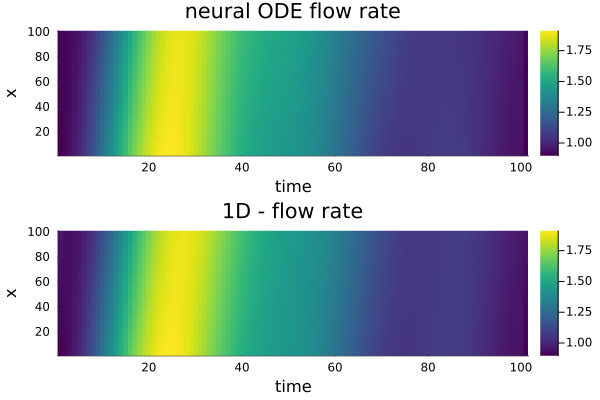

waveform batch: 4/6
Using ADAM optimizer
Sum of params:12.759807
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 42.38089679682913
Iteration: 2 || Loss: 49.6593291983423
Iteration: 3 || Loss: 40.2418563819471
Iteration: 4 || Loss: 38.88672230791419
Iteration: 5 || Loss: 41.665037001142224
Iteration: 6 || Loss: 38.88672230791419
saving ADAM checkpoint...
Sum of params:12.826874
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 38.88672230791419
Iteration: 2 || Loss: 37.5162893898668
Iteration: 3 || Loss: 30.346324931368496
Iteration: 4 || Loss: 28.076354756335938
Iteration: 5 || Loss: 27.340440999149994
Iteration: 6 || Loss: 19.809688693330063
Iteration: 7 || Loss: 18.655416794193624
Iteration: 8 || Loss: 16.939995668570372
Iteration: 9 || Loss: 16.53776068987174
Iteration: 10 || Loss: 16.082179779414112
Iteration: 11 || Loss: 16.056286793260675
Iteration: 12 || Loss: 16.00600589576171
Iteration: 13 || Loss: 15.996214678982408
Iteration: 

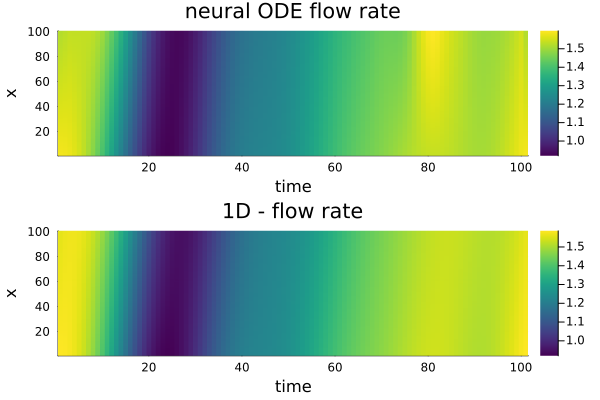

waveform batch: 5/6
Using ADAM optimizer
Sum of params:12.933687
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 42.82207739226543
Iteration: 2 || Loss: 35.80510073752105
Iteration: 3 || Loss: 39.72189366560153
Iteration: 4 || Loss: 33.85331689037776
Iteration: 5 || Loss: 30.871992957001854
Iteration: 6 || Loss: 30.871992957001854
saving ADAM checkpoint...
Sum of params:12.955215
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 30.871992957001854
Iteration: 2 || Loss: 30.796980762990696
Iteration: 3 || Loss: 22.907226716221384
Iteration: 4 || Loss: 15.950614159962775
Iteration: 5 || Loss: 10.679178940621991
Iteration: 6 || Loss: 8.84566461844113
Iteration: 7 || Loss: 8.654865788588502
Iteration: 8 || Loss: 8.607018467151146
Iteration: 9 || Loss: 8.602851083027579
Iteration: 10 || Loss: 8.599193398988517
Iteration: 11 || Loss: 8.564793478275552
Iteration: 12 || Loss: 8.536752705858776
Iteration: 13 || Loss: 8.511776649935705
Iteration: 1

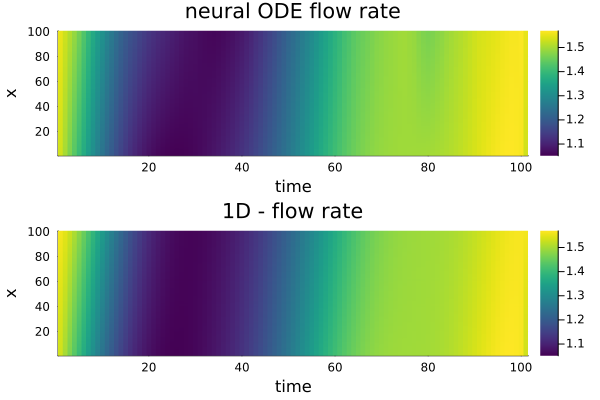

waveform batch: 6/6
Using ADAM optimizer
Sum of params:14.257165
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 38.020742692467735
Iteration: 2 || Loss: 32.391779877831226
Iteration: 3 || Loss: 35.452878608160944
Iteration: 4 || Loss: 30.529381030522494
Iteration: 5 || Loss: 28.142884484502904
Iteration: 6 || Loss: 28.142884484502904
saving ADAM checkpoint...
Sum of params:14.275735
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 28.142884484502904
Iteration: 2 || Loss: 28.08881495663896
Iteration: 3 || Loss: 24.044464727234455
Iteration: 4 || Loss: 17.674381955444012
Iteration: 5 || Loss: 14.214754954137724
Iteration: 6 || Loss: 13.777867230403707
Iteration: 7 || Loss: 13.704421457052597
Iteration: 8 || Loss: 13.679709800215717
Iteration: 9 || Loss: 13.66559155908151
Iteration: 10 || Loss: 13.548511537386222
Iteration: 11 || Loss: 13.169852980442002
Iteration: 12 || Loss: 13.047236180769767
Iteration: 13 || Loss: 12.857557538243247
I

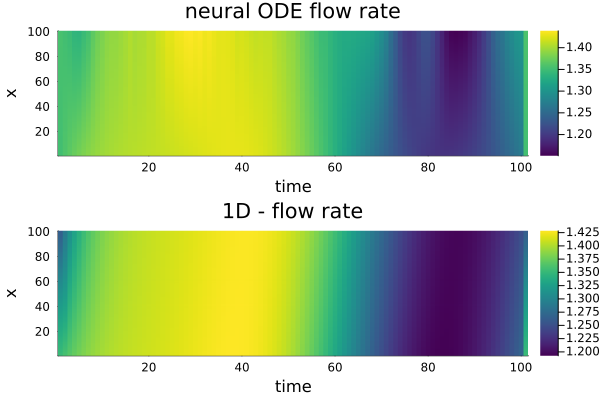

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Testing:
waveform batch: 1/4
Test loss:34.309757719497654


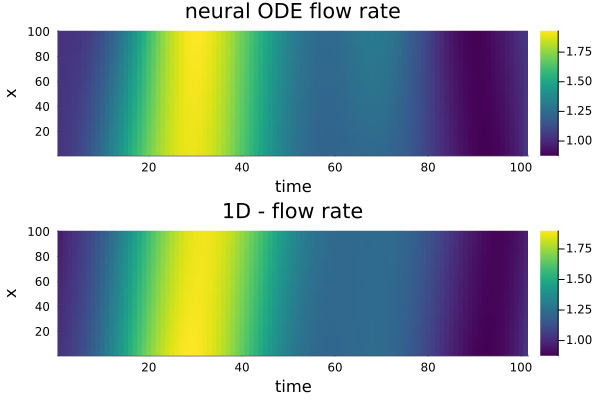

waveform batch: 2/4
Test loss:191.95933582458989


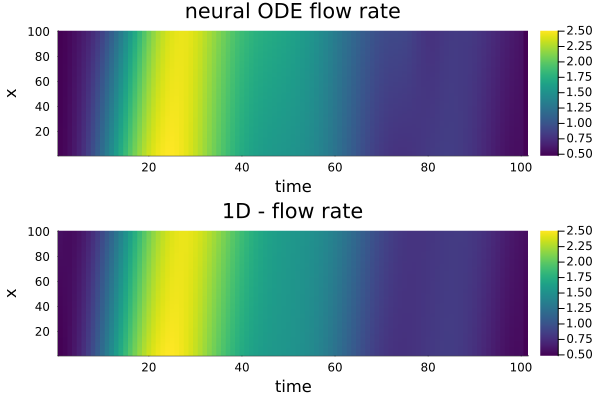

waveform batch: 3/4
Test loss:347.46569951639117


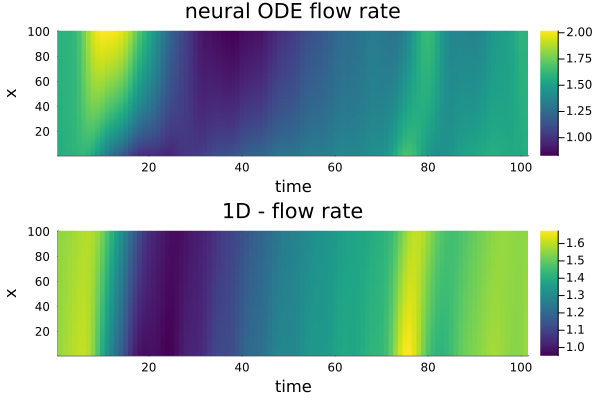

waveform batch: 4/4
Test loss:17.83906341770565


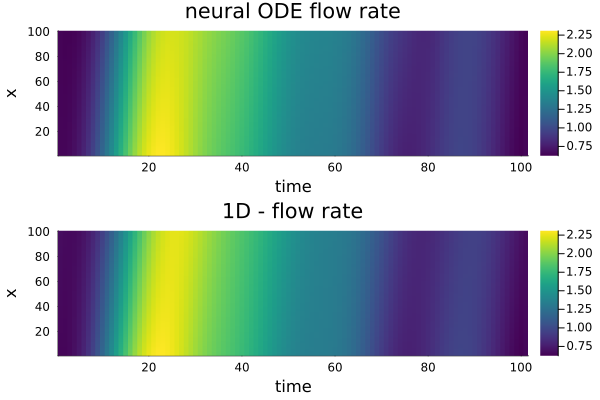

Epoch 9 mean loss loss:4.103348408112568
Start training epoch 10
waveform batch: 1/6
Using ADAM optimizer
Sum of params:15.149179
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 260.88928449223783
Iteration: 2 || Loss: 221.69800537256185
Iteration: 3 || Loss: 216.96738999282886
Iteration: 4 || Loss: 212.92585734976632
Iteration: 5 || Loss: 198.59322194555529
Iteration: 6 || Loss: 198.59322194555529
saving ADAM checkpoint...
Sum of params:15.042104
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 198.59322194555529
Iteration: 2 || Loss: 188.30816044447175
Iteration: 3 || Loss: 91.42173484763121
Iteration: 4 || Loss: 61.23353328830022
Iteration: 5 || Loss: 37.92364263835668
Iteration: 6 || Loss: 37.327264407502824
Iteration: 7 || Loss: 36.89323774552804
Iteration: 8 || Loss: 32.483064520530554
Iteration: 9 || Loss: 31.67471749536161
Iteration: 10 || Loss: 27.230620790824005
Iteration: 11 || Loss: 26.33733033429041
Iteration: 12 || Loss: 2

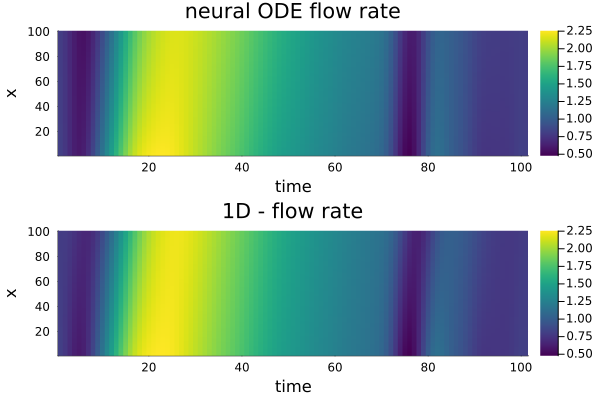

waveform batch: 2/6
Using ADAM optimizer
Sum of params:14.858955
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 51.72649409498031
Iteration: 2 || Loss: 54.183632037897496
Iteration: 3 || Loss: 50.32011216506534
Iteration: 4 || Loss: 47.87352568417904
Iteration: 5 || Loss: 49.70521381935993
Iteration: 6 || Loss: 47.87352568417904
saving ADAM checkpoint...
Sum of params:14.903484
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 47.87352568417904
Iteration: 2 || Loss: 47.779989061574156
Iteration: 3 || Loss: 45.829543192033626
Iteration: 4 || Loss: 43.720877676175064
Iteration: 5 || Loss: 42.17213913155227
Iteration: 6 || Loss: 41.929246708092165
Iteration: 7 || Loss: 41.83052159576945
Iteration: 8 || Loss: 41.73013618351224
Iteration: 9 || Loss: 41.3389869537166
Iteration: 10 || Loss: 40.75188015399289
Iteration: 11 || Loss: 40.60054693854719
Iteration: 12 || Loss: 40.57270948578032
Iteration: 13 || Loss: 40.56001649344063
Iteration: 14 

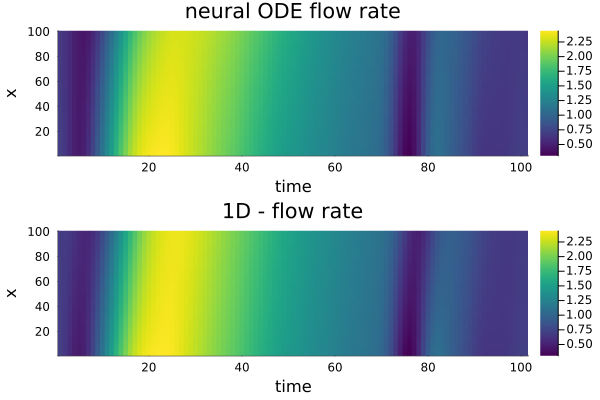

waveform batch: 3/6
Using ADAM optimizer
Sum of params:20.50388
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 46.52810163103333
Iteration: 2 || Loss: 52.900885410927906
Iteration: 3 || Loss: 44.7557566197316
Iteration: 4 || Loss: 49.56991491475205
Iteration: 5 || Loss: 47.21161701515404
Iteration: 6 || Loss: 44.7557566197316
saving ADAM checkpoint...
Sum of params:20.498413
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 44.7557566197316
Iteration: 2 || Loss: 44.61858431358251
Iteration: 3 || Loss: 38.74636022528302
Iteration: 4 || Loss: 29.289923241083887
Iteration: 5 || Loss: 27.696946381655312
Iteration: 6 || Loss: 27.334084637835062
Iteration: 7 || Loss: 27.153363095584158
Iteration: 8 || Loss: 27.100562862587207
Iteration: 9 || Loss: 27.083290930066262
Iteration: 10 || Loss: 27.07413410990663
Iteration: 11 || Loss: 27.06991014333979
Iteration: 12 || Loss: 27.06555221022713
Iteration: 13 || Loss: 27.063360001748354
Iteration: 14 

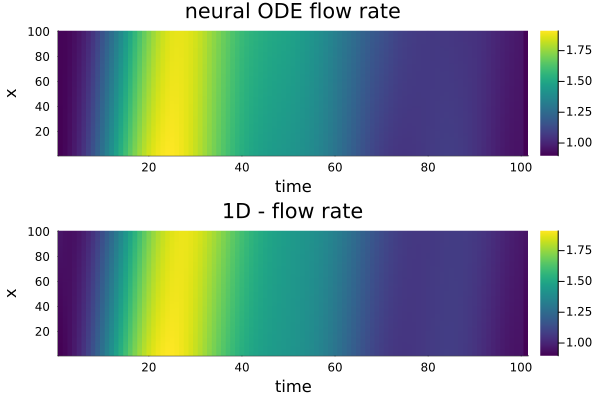

waveform batch: 4/6
Using ADAM optimizer
Sum of params:21.054394
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 161.8234655062169
Iteration: 2 || Loss: 108.80413257647368
Iteration: 3 || Loss: 88.97879364983994
Iteration: 4 || Loss: 93.0036402522444
Iteration: 5 || Loss: 102.21138008518504
Iteration: 6 || Loss: 88.97879364983994
saving ADAM checkpoint...
Sum of params:20.98235
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 88.97879364983994
Iteration: 2 || Loss: 86.37236469881353
Iteration: 3 || Loss: 60.897626256953835
Iteration: 4 || Loss: 37.08249254702078
Iteration: 5 || Loss: 27.23280994924037
Iteration: 6 || Loss: 25.372059435837688
Iteration: 7 || Loss: 24.23174999157884
Iteration: 8 || Loss: 23.46499050495449
Iteration: 9 || Loss: 23.126851257061475
Iteration: 10 || Loss: 23.074404998596986
Iteration: 11 || Loss: 23.024306229054417
Iteration: 12 || Loss: 22.901425826553346
Iteration: 13 || Loss: 22.381729771397197
Iteration: 

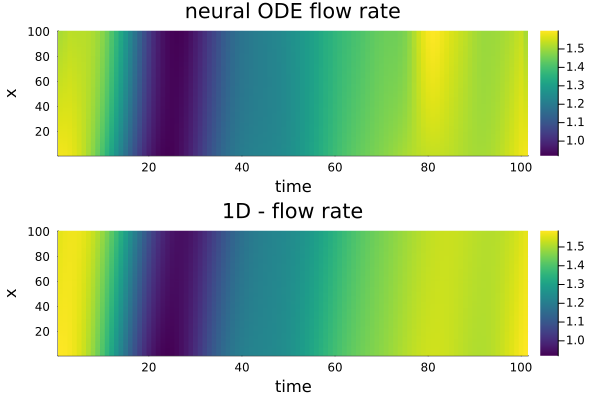

waveform batch: 5/6
Using ADAM optimizer
Sum of params:20.81314
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 67.76117760544852
Iteration: 2 || Loss: 49.44947844223368
Iteration: 3 || Loss: 52.02538110205658
Iteration: 4 || Loss: 54.93663988563371
Iteration: 5 || Loss: 51.031278033890494
Iteration: 6 || Loss: 49.44947844223368
saving ADAM checkpoint...
Sum of params:20.82904
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 49.44947844223368
Iteration: 2 || Loss: 48.695451363001716
Iteration: 3 || Loss: 33.94982143672437
Iteration: 4 || Loss: 25.004191382577762
Iteration: 5 || Loss: 23.226964782361595
Iteration: 6 || Loss: 18.0328092690201
Iteration: 7 || Loss: 14.221313730907648
Iteration: 8 || Loss: 10.273552071958912
Iteration: 9 || Loss: 9.700502770402196
Iteration: 10 || Loss: 9.391749283047105
Iteration: 11 || Loss: 9.24021009651482
Iteration: 12 || Loss: 9.189932499990725
Iteration: 13 || Loss: 9.177158298894087
Iteration: 14 ||

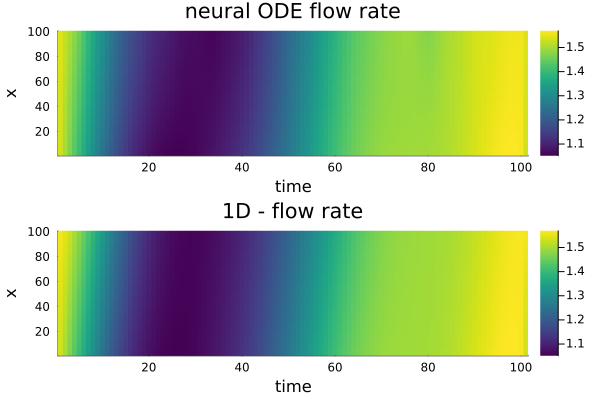

waveform batch: 6/6
Using ADAM optimizer
Sum of params:19.050863
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 1425.0999571666553
Iteration: 2 || Loss: 1344.789257054176
Iteration: 3 || Loss: 1285.2688410202945
Iteration: 4 || Loss: 1243.608900959716
Iteration: 5 || Loss: 1212.3722572593656
Iteration: 6 || Loss: 1212.3722572593656
saving ADAM checkpoint...
Sum of params:19.21998
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 1212.3722572593656
Iteration: 2 || Loss: 1188.4350125394608
Iteration: 3 || Loss: 239.085463183383
Iteration: 4 || Loss: 126.92928119952927
Iteration: 5 || Loss: 53.648070048785954
Iteration: 6 || Loss: 44.489525998352505
Iteration: 7 || Loss: 40.21347041034515
Iteration: 8 || Loss: 28.232425323650684
Iteration: 9 || Loss: 25.7400552713835
Iteration: 10 || Loss: 24.524932027590612
Iteration: 11 || Loss: 23.1288029973572
Iteration: 12 || Loss: 17.597495879933234
Iteration: 13 || Loss: 15.635605746419522
Iteration

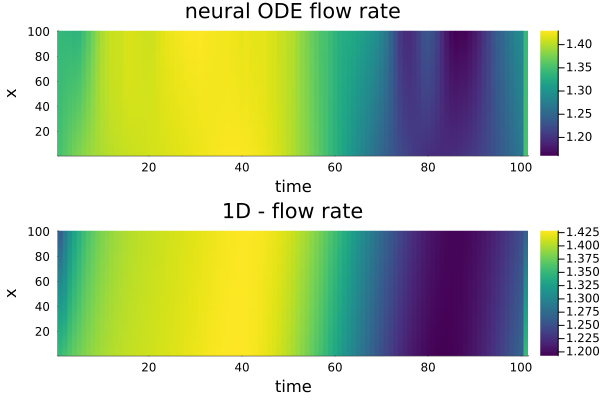

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Testing:
waveform batch: 1/4
Test loss:186.95407003745657


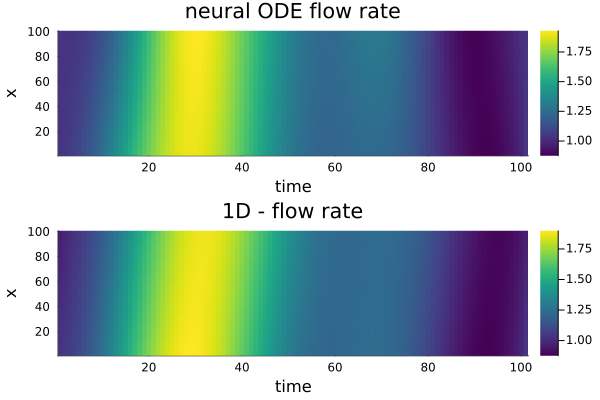

waveform batch: 2/4
Test loss:51.297604741002175


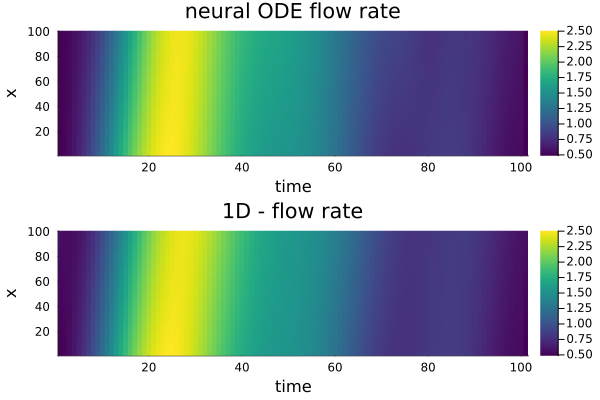

waveform batch: 3/4
Test loss:60.584744309685405


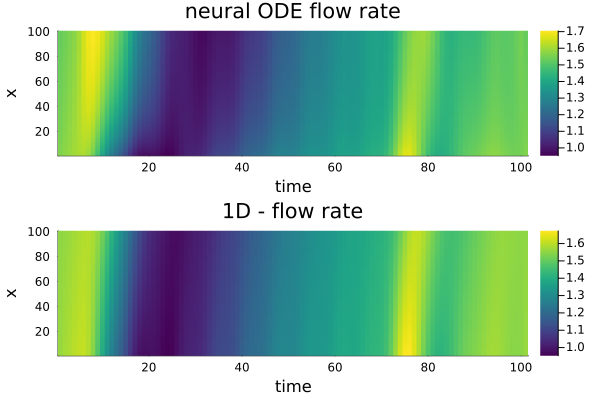

waveform batch: 4/4
Test loss:18.810547559912493


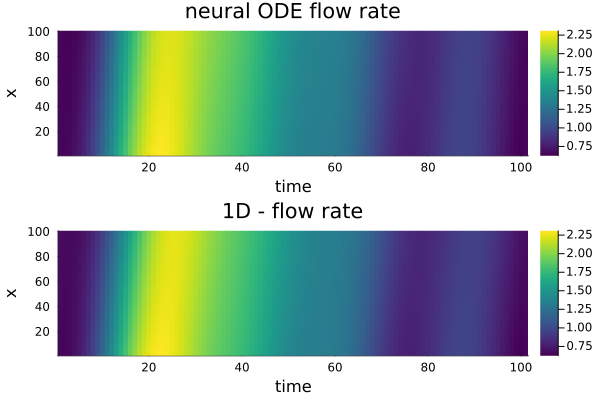

Epoch 10 mean loss loss:3.961729993258184
Start training epoch 11
waveform batch: 1/6
Using ADAM optimizer
Sum of params:21.210648
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 72.40430489112335
Iteration: 2 || Loss: 68.47631737777614
Iteration: 3 || Loss: 67.34760908485069
Iteration: 4 || Loss: 62.00796816378212
Iteration: 5 || Loss: 59.15476506279967
Iteration: 6 || Loss: 59.15476506279967
saving ADAM checkpoint...
Sum of params:21.095894
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 59.15476506279967
Iteration: 2 || Loss: 58.92773757391032
Iteration: 3 || Loss: 37.28029861005782
Iteration: 4 || Loss: 35.025781526536186
Iteration: 5 || Loss: 33.14398989667767
Iteration: 6 || Loss: 30.35650412167175
Iteration: 7 || Loss: 29.700913610851508
Iteration: 8 || Loss: 29.409495505640653
Iteration: 9 || Loss: 29.163101835706378
Iteration: 10 || Loss: 28.246529337221823
Iteration: 11 || Loss: 26.420650271284842
Iteration: 12 || Loss: 24.99

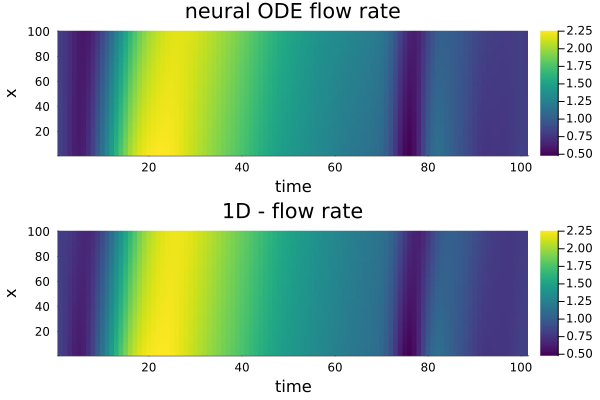

waveform batch: 2/6
Using ADAM optimizer
Sum of params:17.950603
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 4778.278740239634
Iteration: 2 || Loss: 4526.174273144637
Iteration: 3 || Loss: 4273.515833741215
Iteration: 4 || Loss: 4020.305999778355
Iteration: 5 || Loss: 3756.1007376843513
Iteration: 6 || Loss: 3756.1007376843513
saving ADAM checkpoint...
Sum of params:18.10159
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 3756.1007376843513
Iteration: 2 || Loss: 1986.899406857034
Iteration: 3 || Loss: 291.97089015743103
Iteration: 4 || Loss: 88.38093751524588
Iteration: 5 || Loss: 61.245201122178884
Iteration: 6 || Loss: 60.99982846245207
Iteration: 7 || Loss: 60.758569301708754
Iteration: 8 || Loss: 58.5199741746468
Iteration: 9 || Loss: 58.39915951241316
Iteration: 10 || Loss: 55.62777857227974
Iteration: 11 || Loss: 55.210414293769865
Iteration: 12 || Loss: 55.03041762314617
Iteration: 13 || Loss: 53.34907872977578
Iteration: 14

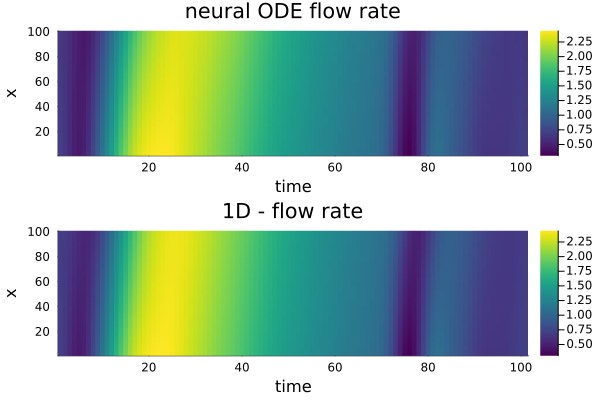

waveform batch: 3/6
Using ADAM optimizer
Sum of params:19.81977
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 51.454211764514916
Iteration: 2 || Loss: 68.25457027735088
Iteration: 3 || Loss: 50.79606083273181
Iteration: 4 || Loss: 53.69256765553245
Iteration: 5 || Loss: 58.659887265195536
Iteration: 6 || Loss: 50.79606083273181
saving ADAM checkpoint...
Sum of params:19.846176
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 50.79606083273181
Iteration: 2 || Loss: 50.360836077645374
Iteration: 3 || Loss: 48.36614837191052
Iteration: 4 || Loss: 42.410574068134316
Iteration: 5 || Loss: 34.256285048359
Iteration: 6 || Loss: 32.02971516881385
Iteration: 7 || Loss: 31.34329007501882
Iteration: 8 || Loss: 30.939621000516617
Iteration: 9 || Loss: 30.655622513952025
Iteration: 10 || Loss: 30.525280079592328
Iteration: 11 || Loss: 30.323711020311414
Iteration: 12 || Loss: 30.269696068069123
Iteration: 13 || Loss: 30.113519611404616
Iteration: 

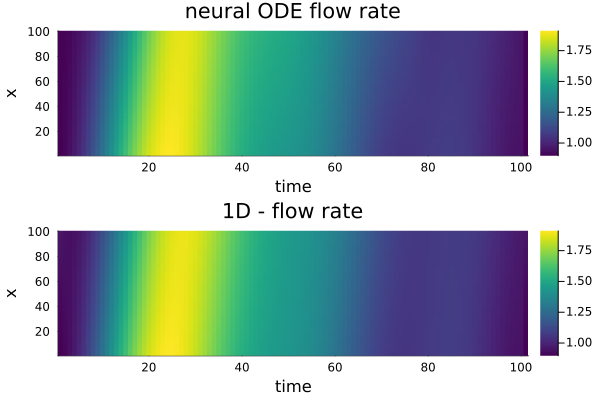

waveform batch: 4/6
Using ADAM optimizer
Sum of params:19.8732
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 317295.102620608
Iteration: 2 || Loss: 312039.19352934667
Iteration: 3 || Loss: 306691.63984455384
Iteration: 4 || Loss: 301217.0508809767
Iteration: 5 || Loss: 295598.9923147434
Iteration: 6 || Loss: 295598.9923147434
saving ADAM checkpoint...
Sum of params:19.787027
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 295598.9923147434
Iteration: 2 || Loss: 16775.194760239196
Iteration: 3 || Loss: 11903.890676362676
Iteration: 4 || Loss: 11903.19330163869
Iteration: 5 || Loss: 11621.04323113122
Iteration: 6 || Loss: 11497.90726706572
Iteration: 7 || Loss: 11419.773876203395
Iteration: 8 || Loss: 11352.96932344282
Iteration: 9 || Loss: 11154.965732912966
Iteration: 10 || Loss: 10139.861733323778
Iteration: 11 || Loss: 1078.132306701016
Iteration: 12 || Loss: 975.6098427617987
Iteration: 13 || Loss: 670.547498490572
Iteration: 14 |

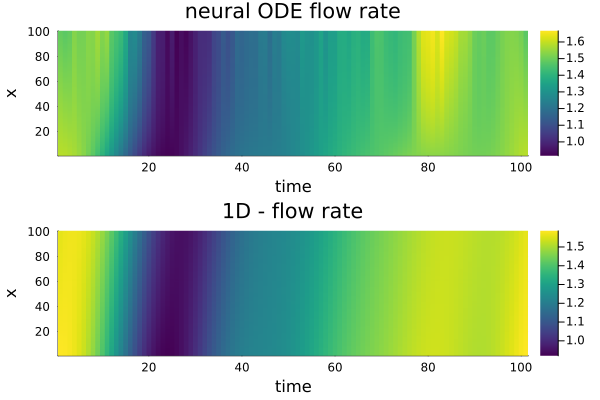

waveform batch: 5/6
Using ADAM optimizer
Sum of params:23.264038
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 57.656228927121205
Iteration: 2 || Loss: 67.21045008524553
Iteration: 3 || Loss: 55.57026302985766
Iteration: 4 || Loss: 56.858657160785
Iteration: 5 || Loss: 59.05175751612378
Iteration: 6 || Loss: 55.57026302985766
saving ADAM checkpoint...
Sum of params:23.274145
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 55.57026302985766
Iteration: 2 || Loss: 55.029614152822596
Iteration: 3 || Loss: 42.32560279926782
Iteration: 4 || Loss: 25.84033454142488
Iteration: 5 || Loss: 22.25715174552592
Iteration: 6 || Loss: 20.82755506123124
Iteration: 7 || Loss: 19.949621419349096
Iteration: 8 || Loss: 19.734321844127948
Iteration: 9 || Loss: 19.518648789896258
Iteration: 10 || Loss: 19.44842377256268
Iteration: 11 || Loss: 19.427087400172248
Iteration: 12 || Loss: 19.42307764417366
Iteration: 13 || Loss: 19.41448059331811
Iteration: 14 

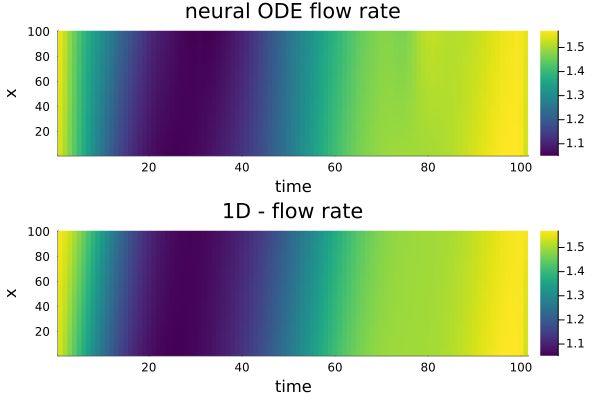

waveform batch: 6/6
Using ADAM optimizer
Sum of params:22.578869
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 2278.342393984555
Iteration: 2 || Loss: 2206.3533108386896
Iteration: 3 || Loss: 2153.7690260075515
Iteration: 4 || Loss: 2108.26503300617
Iteration: 5 || Loss: 2060.936155823426
Iteration: 6 || Loss: 2060.936155823426
saving ADAM checkpoint...
Sum of params:22.580822
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 2060.936155823426
Iteration: 2 || Loss: 2031.521038553055
Iteration: 3 || Loss: 1738.2186747103447
Iteration: 4 || Loss: 136.7748889504276
Iteration: 5 || Loss: 127.71401467559565
Iteration: 6 || Loss: 46.79946001482493
Iteration: 7 || Loss: 40.45078852601221
Iteration: 8 || Loss: 35.6778001197259
Iteration: 9 || Loss: 33.758148837557734
Iteration: 10 || Loss: 23.433719219108507
Iteration: 11 || Loss: 21.09806382462759
Iteration: 12 || Loss: 19.112524855322558
Iteration: 13 || Loss: 14.696717614255013
Iteration: 1

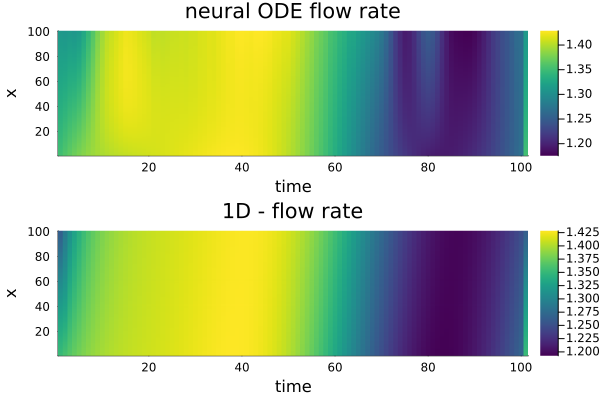

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Testing:
waveform batch: 1/4
Test loss:115.35989358539706


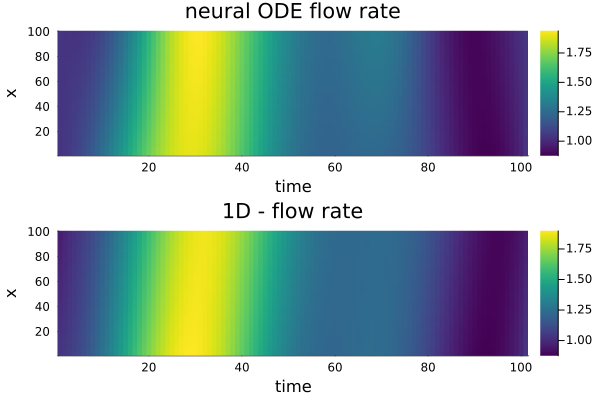

waveform batch: 2/4
Test loss:256.30272007408416


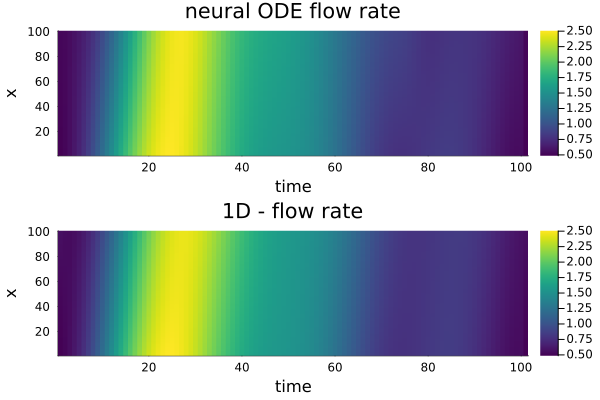

waveform batch: 3/4
Test loss:376.45875280148846


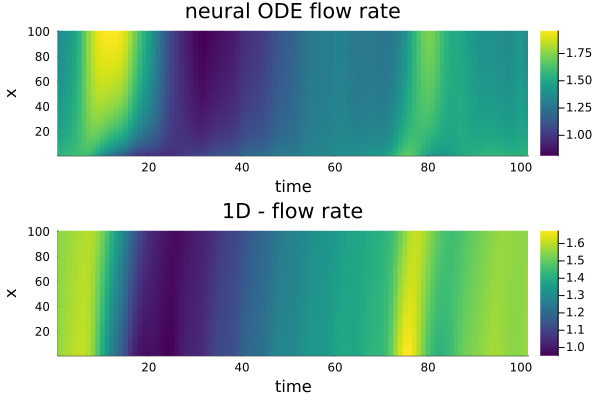

waveform batch: 4/4
Test loss:19.167642203855102


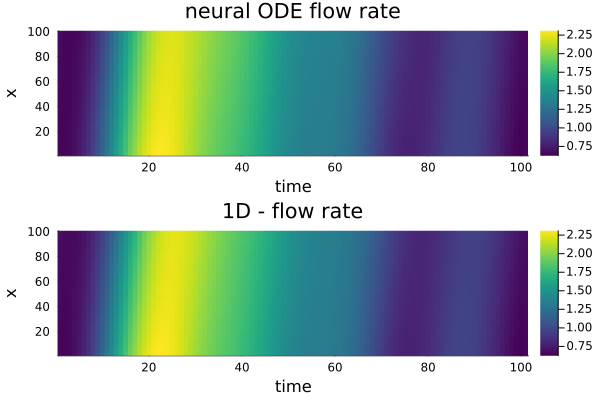

Epoch 11 mean loss loss:5.087616565737404
Start training epoch 12
waveform batch: 1/6
Using ADAM optimizer
Sum of params:26.862574
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 248.66890772582224
Iteration: 2 || Loss: 222.9045665271731
Iteration: 3 || Loss: 212.52590648208786
Iteration: 4 || Loss: 207.62849016105866
Iteration: 5 || Loss: 201.02952225354966
Iteration: 6 || Loss: 201.02952225354966
saving ADAM checkpoint...
Sum of params:26.795858
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 201.02952225354966
Iteration: 2 || Loss: 193.73932126816715
Iteration: 3 || Loss: 88.34783885479371
Iteration: 4 || Loss: 58.07793446391495
Iteration: 5 || Loss: 49.71788900739233
Iteration: 6 || Loss: 45.650875986680994
Iteration: 7 || Loss: 43.27988927500905
Iteration: 8 || Loss: 41.37874010900489
Iteration: 9 || Loss: 39.7824680957429
Iteration: 10 || Loss: 38.457524732196035
Iteration: 11 || Loss: 35.811118801565215
Iteration: 12 || Loss: 34

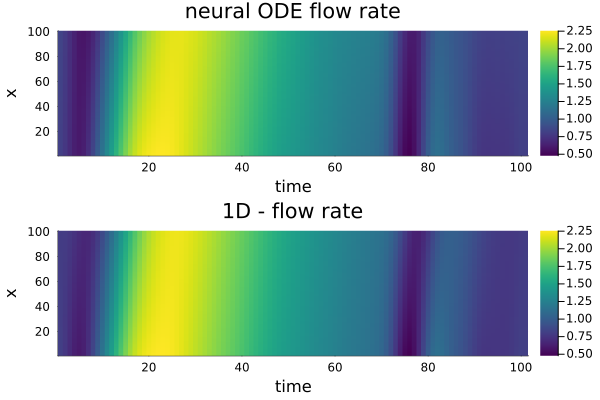

waveform batch: 2/6
Using ADAM optimizer
Sum of params:23.515736
Max iters:5
Choosing ADAM Optimizer.
Iteration: 1 || Loss: 186.46477248132615
Iteration: 2 || Loss: 154.9791401755109
Iteration: 3 || Loss: 149.13199468793687
Iteration: 4 || Loss: 145.36936093374078
Iteration: 5 || Loss: 134.54814171606364
Iteration: 6 || Loss: 134.54814171606364
saving ADAM checkpoint...
Sum of params:23.61884
Switching to BFGS optimizer
Max iters:50
Choosing BFGS Optimizer.
Iteration: 1 || Loss: 134.54814171606364
Iteration: 2 || Loss: 125.59195696790557
Iteration: 3 || Loss: 66.74583637469844
Iteration: 4 || Loss: 62.89091266028633
Iteration: 5 || Loss: 59.24461900406533
Iteration: 6 || Loss: 57.555959680353
Iteration: 7 || Loss: 57.044711822646626
Iteration: 8 || Loss: 51.84565057238146
Iteration: 9 || Loss: 50.68282323711443
Iteration: 10 || Loss: 47.162549130926564
Iteration: 11 || Loss: 46.946072861347155
Iteration: 12 || Loss: 46.27301128756364
Iteration: 13 || Loss: 44.95705124782745
Iteration: 

LoadError: InterruptException:

In [86]:
list_loss_train = []
list_loss_epoch = []
list_loss_test = []
for j in 1:n_epochs
    println("Start training epoch ",j)
    loss_tot = 0.0
    loss_tot_test = 0.0
            # loop over different waveforms
            for i in 1:batch_iterations
                
                println("waveform batch: ",i, "/",batch_iterations)

                #reorder ytrain to (spatial location, batch_size, time)
                ytrain = permutedims(ytrain2[:,:,batch_size*(i-1)+1:batch_size*i],(1,3,2))

                #define optimization problem
                prob = ODEProblem((u, p, t) -> learn_1DBlood(u, p, t), ytrain[:,:,1], zspan, p);
                optf = Optimization.OptimizationFunction((x,p)->loss(x,ytrain[:,:,:],prob),adtype) ;

                println("Using $optimizer_choice1 optimizer")
                println("Sum of params:", sum(uinit))

                # Change learning rate for ADAM optimizer, BFGS doesn't use it
                if j == 2
                    learning_rate = 0.0001
                    println("Changing learning rate to:",learning_rate)
                end

                uinit = train_loop(uinit,adtype,optf,train_maxiters,learning_rate,optimizer_choice1)
                println("Sum of params:", sum(uinit))

                if !isnothing(optimizer_choice2)
                    println("Switching to $optimizer_choice2 optimizer")

                    uinit = train_loop(uinit,adtype,optf,train_maxiters*10,learning_rate,optimizer_choice2)

                    println("Sum of params:", sum(uinit))

                end


                #calculate final loss and push it to the list
                prob = ODEProblem((u, p, t) -> learn_1DBlood(u, p, t), ytrain[:,:,1], zspan, p);
                l , pred = loss(uinit,ytrain[:,:,:],prob)
                loss_tot = loss_tot + l

                push!(list_loss_train, l)


                # plot solution for comparison
                plot1 = heatmap(pred[:,1,:]', color=:viridis, title = "neural ODE flow rate")
                xlabel!("time")
                ylabel!("x")

                plot2 = heatmap(ytrain[:,1,:]', title="1D - flow rate", color=:viridis)
                xlabel!("time")
                ylabel!("x")
                display(plot(plot1,plot2,layout = (2, 1)))
                sleep(1)
            end    
    
            #testing loop
            println("%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%")
            println("Testing:")

            for i in 1:test_batch_iterations

                println("waveform batch: ",i, "/",test_batch_iterations)

                #reorder ytrain to (spatial location, batch_size, time)
                if i!=test_batch_iterations
                    ytest = permutedims(ytest2[:,:,batch_size*(i-1)+1:batch_size*i],(1,3,2))
                else
                    ytest = permutedims(ytest2[:,:,batch_size*(i-1)+1:end],(1,3,2))
                end


                #calculate final loss and push it to the list
                prob = ODEProblem((u, p, t) -> learn_1DBlood(u, p, t), ytest[:,:,1], zspan, p);
                l , pred = loss(uinit,ytest[:,:,:],prob)
                loss_tot_test = loss_tot_test + l

                push!(list_loss_test, l)
                println("Test loss:",l )

                # plot solution for comparison
                plot1 = heatmap(pred[:,1,:]', color=:viridis, title = "neural ODE flow rate")
                xlabel!("time")
                ylabel!("x")

                plot2 = heatmap(ytest[:,1,:]', title="1D - flow rate", color=:viridis)
                xlabel!("time")
                ylabel!("x")
                display(plot(plot1,plot2,layout = (2, 1)))
                sleep(1)
            end


push!(list_loss_epoch, loss_tot/(size(ytrain2,3)))
println("Epoch ", j, " mean loss loss:", loss_tot/(size(ytrain2,3)))
end

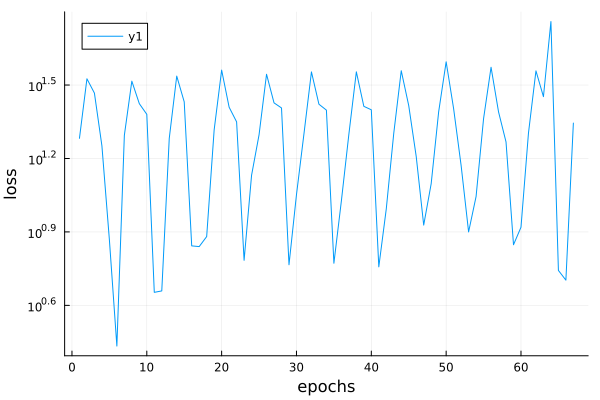

In [87]:
# plot loss as a function of epochs
p3 = plot(list_loss_train, yaxis=:log)
ylabel!("loss")
xlabel!("epochs")
png("parametric_BC_k_1DBlood_loss.png")
display(p3)

### Load the final learnt parameters and do inference for the test set ###

23.515736
saved trained solution


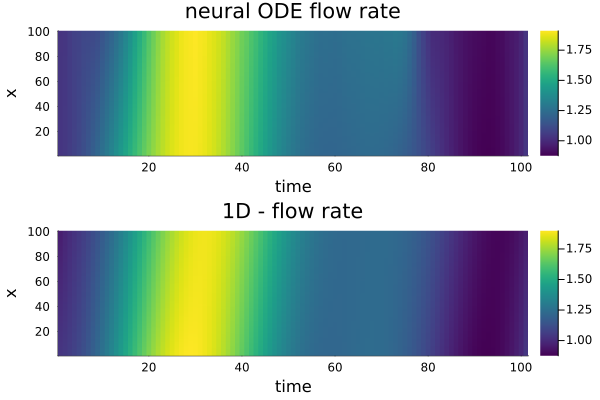

saved trained solution


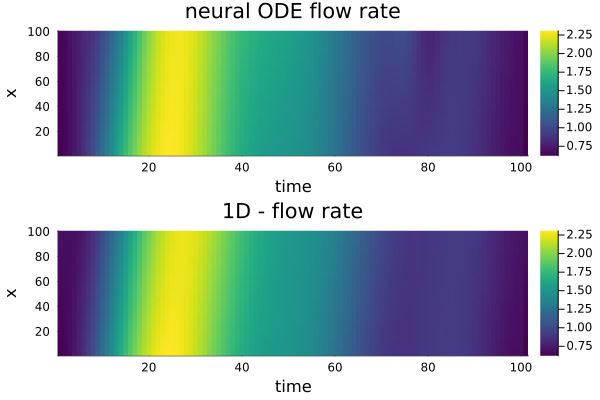

saved trained solution


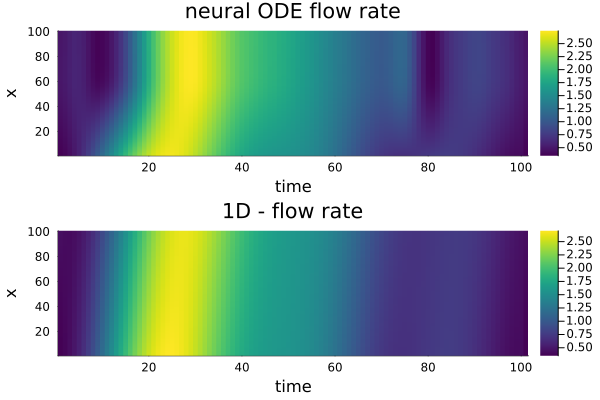

saved trained solution


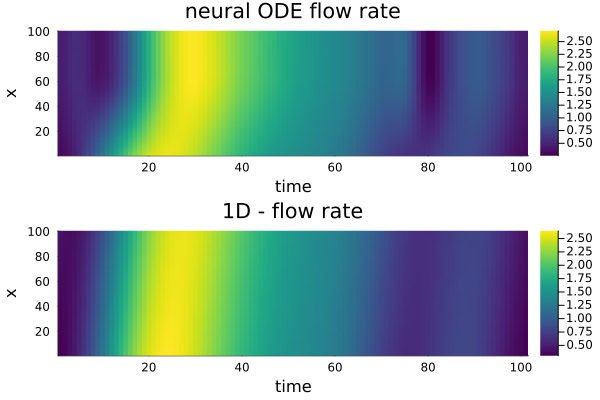

saved trained solution


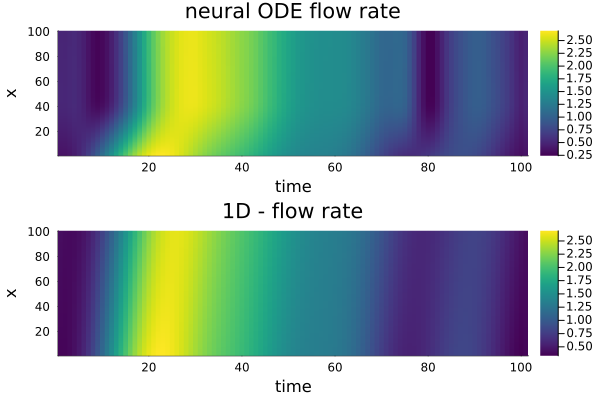

saved trained solution


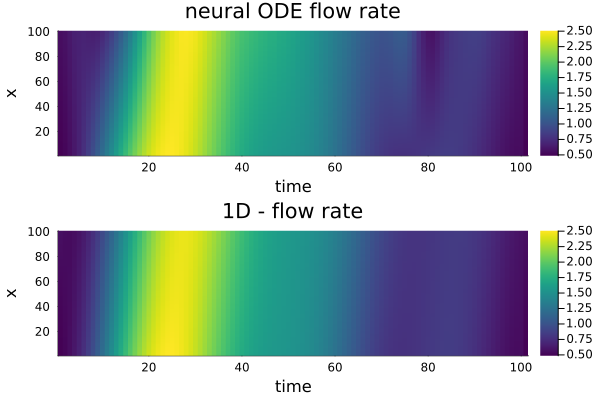

saved trained solution


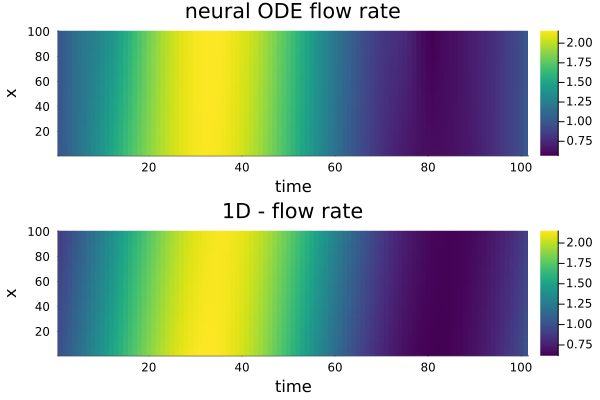

saved trained solution


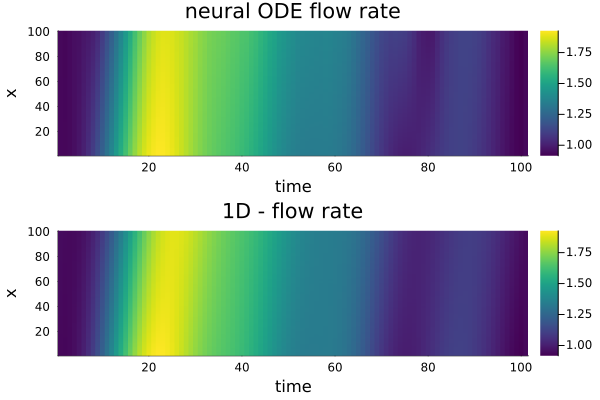

saved trained solution


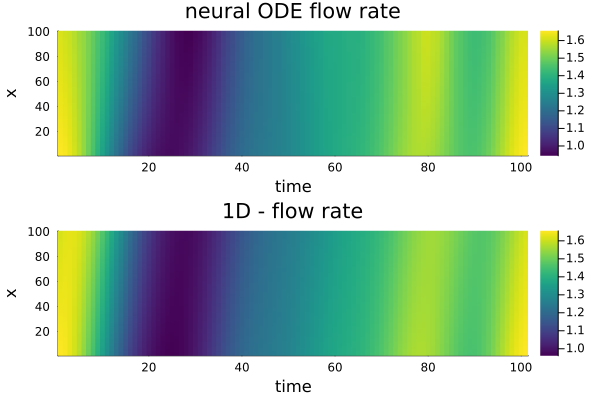

saved trained solution


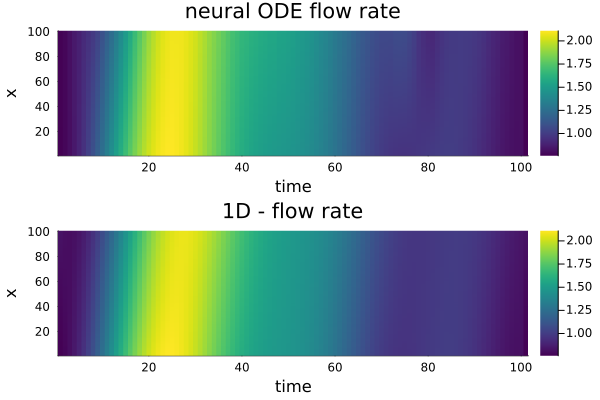

saved trained solution


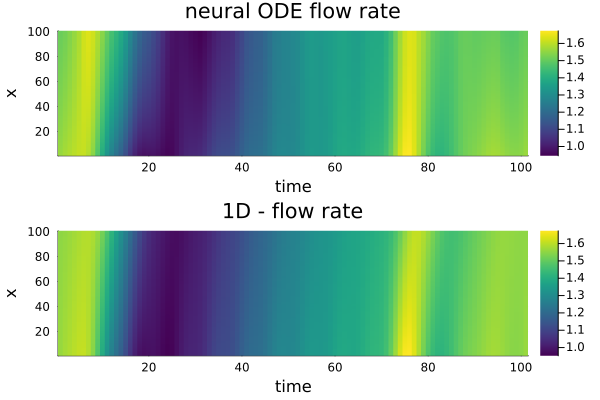

saved trained solution


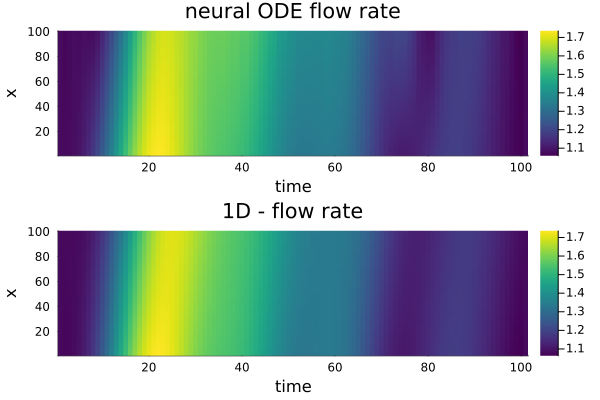

saved trained solution


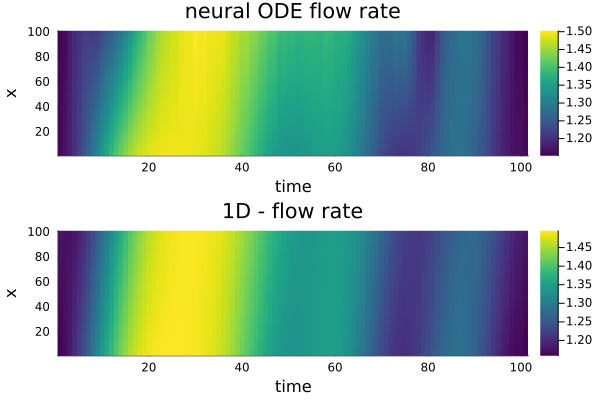

saved trained solution


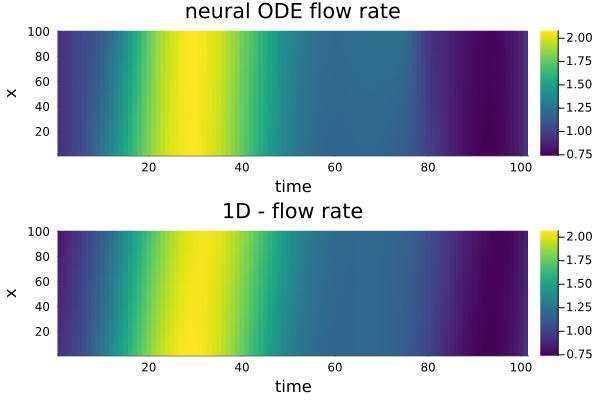

saved trained solution


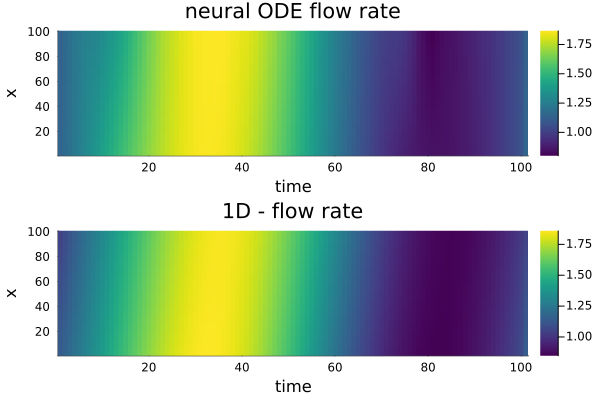

saved trained solution


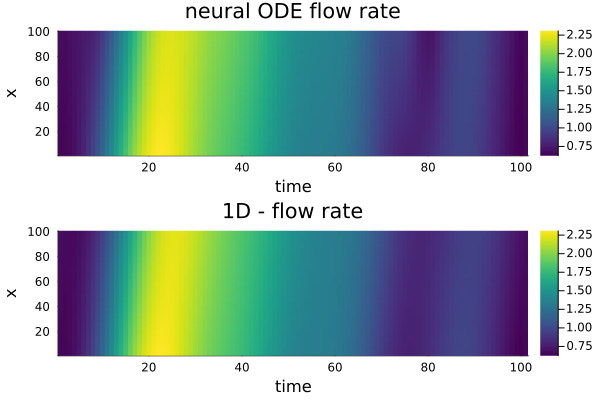

saved trained solution


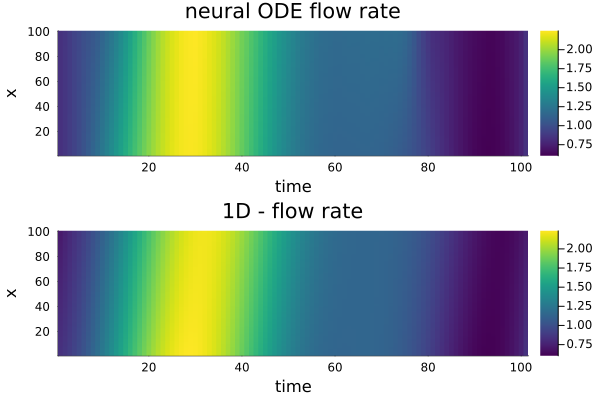

In [ ]:
p_learn = load("/home/tschala/research/LANL/paramBC_testNODE/ptrained_"*optimizer_choice2*".jld2")
#load parameters
p = p_learn["p"]
println(sum(p))
# loop through the test set
for i in 1:17
    u01 = bc_flow_test[:,i]
    L = 3.96                      # total length
    tsteps = 0.0:dz:L             # discretized space dimension
    tspan = (0,L)    

    begin 
        learn_1DBlood_prob_untrained(u01,tspan) = ODEProblem((u, p, t) -> learn_1DBlood(u, p, t,), u01, zspan, p)     # p changes after training   
        if ode_solver == "Tsit5"
            sol_learn_1DBlood_untrained = Array(solve(learn_1DBlood_prob_untrained(u01,zspan),Tsit5(),alg_hints=[:stiff], dt=dz, saveat=dz, reltol=1e-20)); # save on intervals for which we will train on, dt2 
        elseif ode_solver == "RK4"
            sol_learn_1DBlood_untrained = Array(solve(learn_1DBlood_prob_untrained(u01,zspan),RK4(),alg_hints=[:stiff], dt=dz, saveat=dz, reltol=1e-20)); # save on intervals for which we will train on, dt2 
        elseif ode_solver == "Rosenbrock23"
            sol_learn_1DBlood_untrained = Array(solve(learn_1DBlood_prob_untrained(u01,zspan),Rosenbrock23(),alg_hints=[:stiff], dt=dz, saveat=dz, reltol=1e-20)); # save on intervals for which we will train on, dt2 
        end
        save_object(output_dir*"/sol_learn_testNODE_trained.jld2",sol_learn_1DBlood_untrained)
        println("saved trained solution")
    end

    sol_learn = load("/home/tschala/research/LANL/paramBC_testNODE/output/sol_learn_testNODE_trained.jld2");

    plot1 = heatmap(sol_learn["single_stored_object"][:,:]', color=:viridis, title = "neural ODE flow rate")
    xlabel!("time")
    ylabel!("x")

    plot2 = heatmap(ytest2[:,:,i]', title="1D - flow rate", color=:viridis)
    xlabel!("time")
    ylabel!("x")

    display(plot(plot1,plot2,layout = (2, 1)))
    sleep(1)
end